---
Импорт библиотек

In [1]:
from matplotlib import style

import math
from IPython.display import display

from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler
from category_encoders import TargetEncoder, BinaryEncoder, BaseNEncoder, OrdinalEncoder

import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as plt
from scipy.special import expit
from matplotlib import gridspec

from scipy import stats
import statsmodels.api as sm

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
%matplotlib inline

from matplotlib import style


pd.options.mode.chained_assignment = None  # default='warn'
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.cluster import KMeans

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist
from sklearn.metrics import silhouette_score, silhouette_samples

import sweetviz as sv #conda install -c conda-forge sweetviz


---
## 1. Разведочный анализ

In [2]:
df = pd.read_csv('data.csv')

---
1.1. Обзор данных

---

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:01 -> (00:00 left)



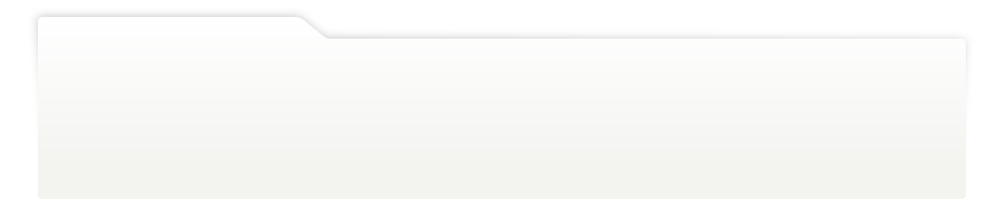
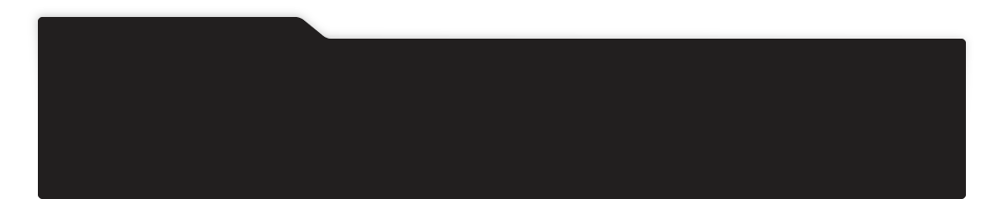
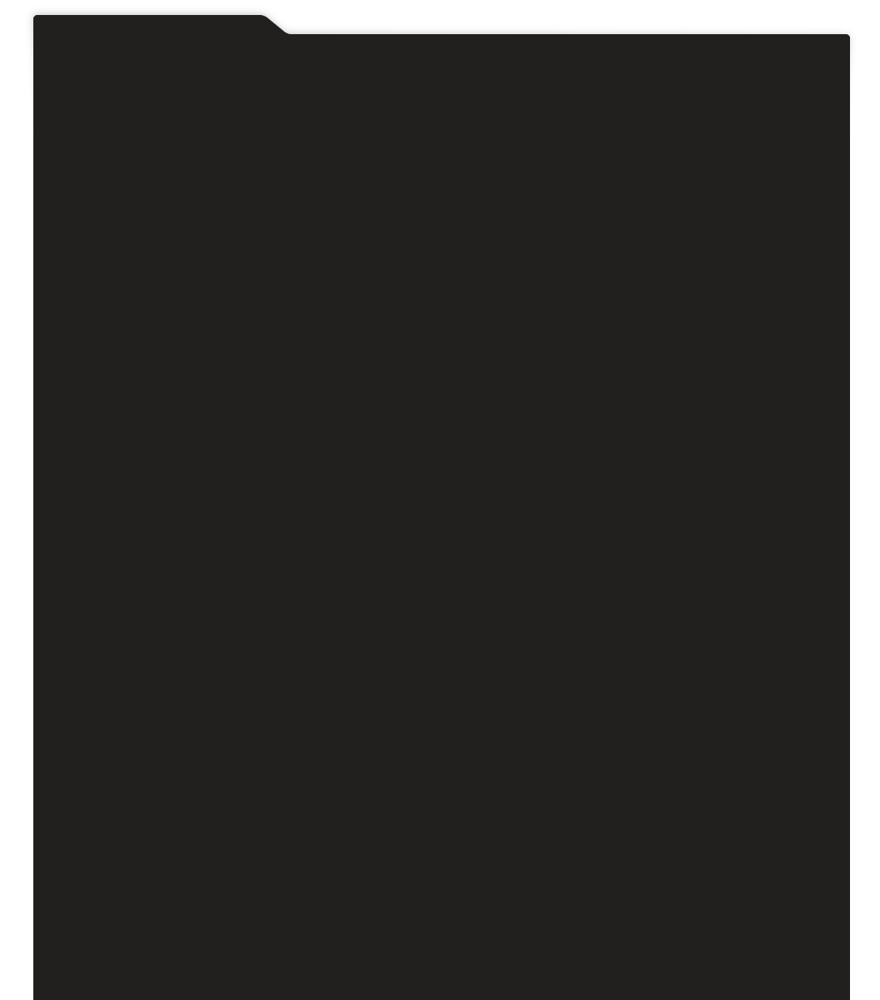
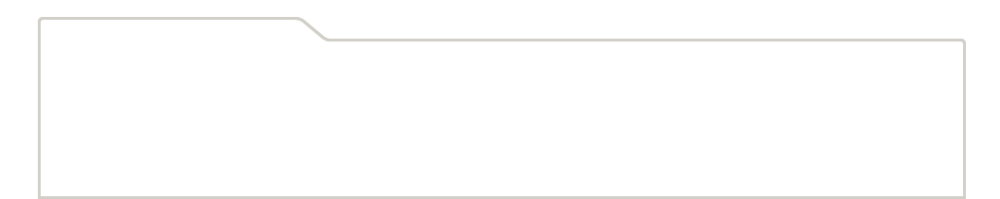
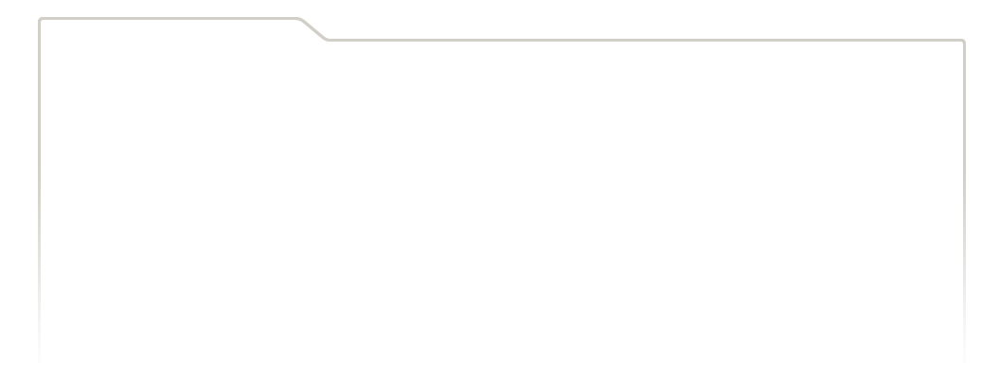
...
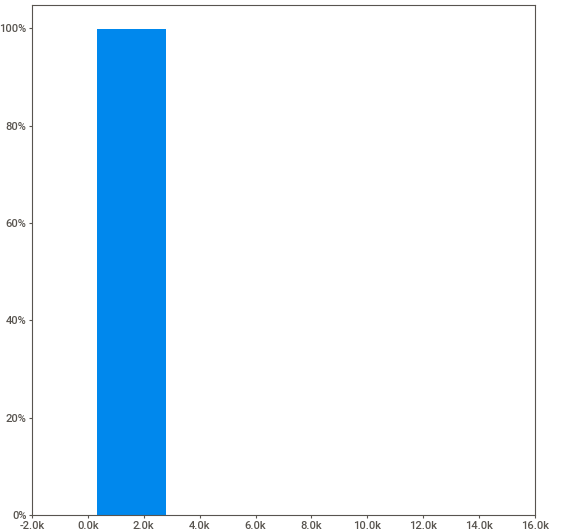
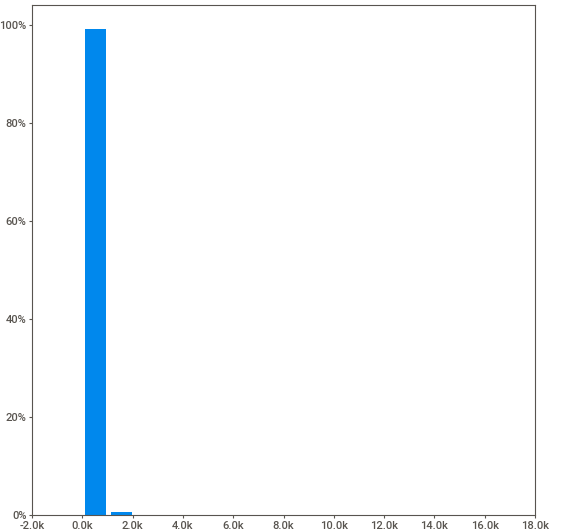
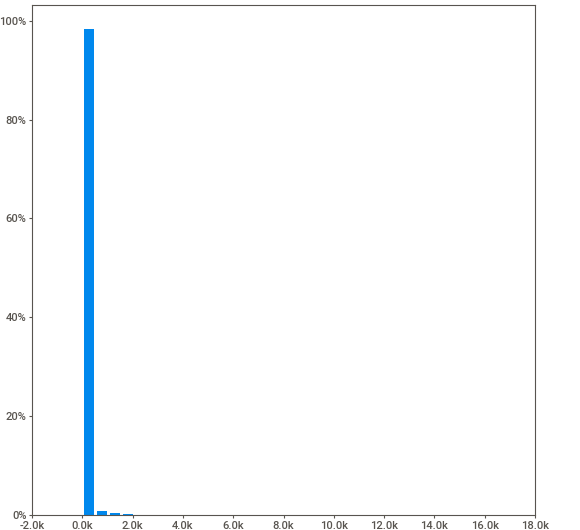
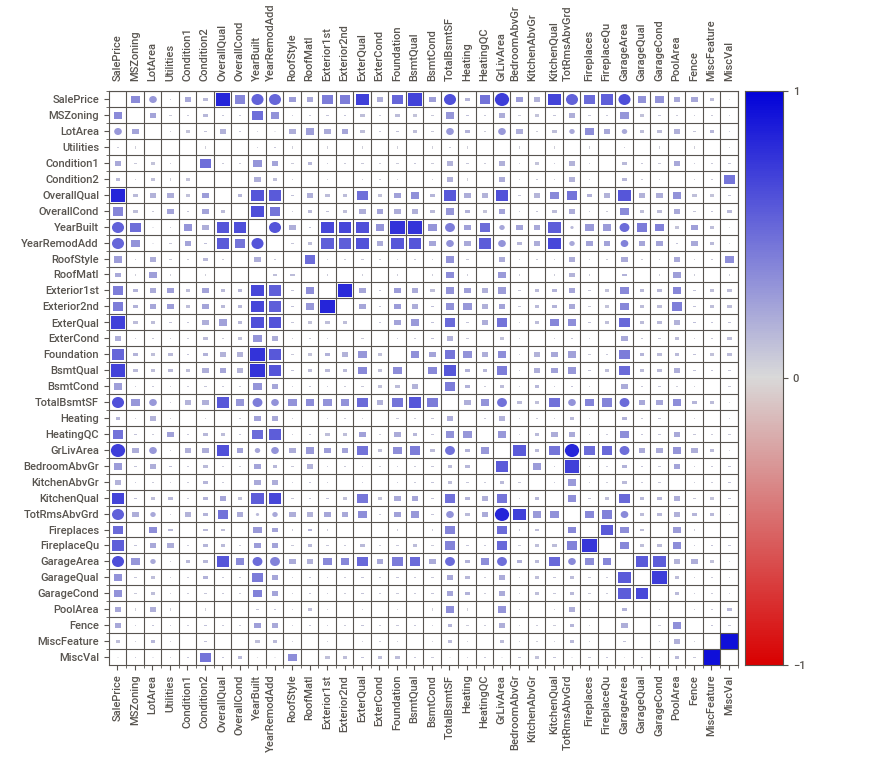
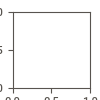

In [3]:
report=sv.analyze(df)
report.show_notebook(layout='vertical', w=880, h=700, scale=0.8)

---
1.2. Выявление пропущенных значений и их обработка

---

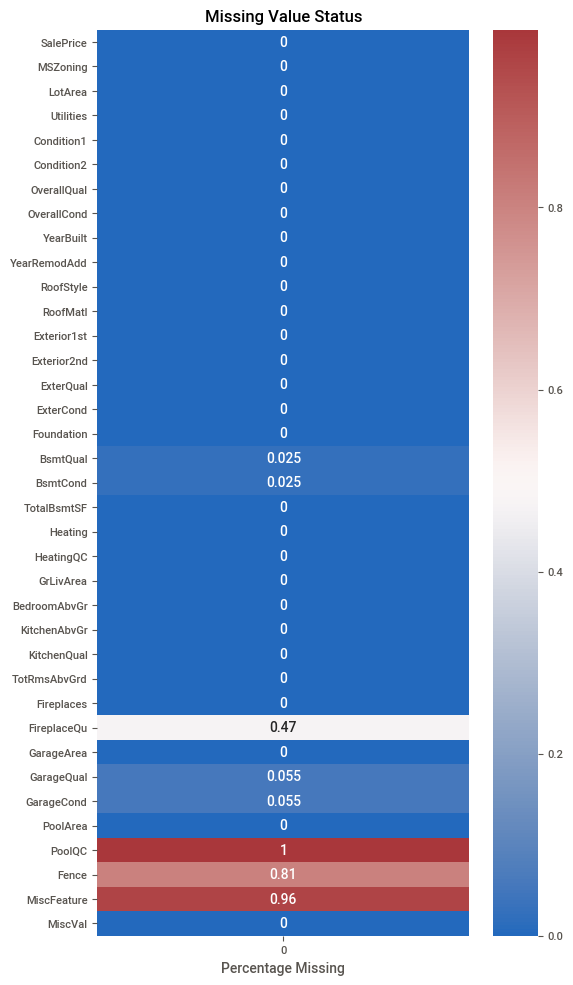

In [4]:
fig, ax = plt.subplots(figsize = (6, 12))
sns.heatmap(df.isna().mean().to_frame(),annot=True,cmap='vlag', ax = ax).set_title('Missing Value Status',fontweight='bold');
ax.set_xlabel('Percentage Missing');

Очень много пропусков по признакам MiscFeature, PoolQC, Fence. Заполнять их нет смысла, лучше просто удалить. Но Fence - это качество забора. Тут скорее важно само его наличие, поэтому лучше его просто перекодировать и сделать признак бинарным (не обращать внимание на материал забора). Бассейн работает по такой же логике, но домов с бассейном меньше процента, есть подозрение, что большинство из них выбросы поэтому его просто удалим.

In [5]:
df.drop(columns = ['MiscFeature', 'PoolQC', 'PoolArea', 'MiscVal'], inplace=True)

Признак FireplaceQu содержит почти половину пропусков. Но если мы посмотрим в описание данных, то обнаружим, что это не пропуски, а просто отсутствие камина. Поэтому просто заменим NA на новый признак - собственно отсутствие камина.

In [6]:
df['Fence'].fillna(0, inplace = True)
df['Fence'] = df['Fence'].map(lambda x: 1 if x != 0 else x)
df['FireplaceQu'].fillna('No', inplace = True)

По остальным признакам с пропусками ситуация в общем та же, NA значит отсутствие соответствующей характеристики. Заполнять модой, разумеется, смысла нет. В то же время значения достаточно малочисленные, но по смыслу следует все-таки создать для них отдельные категории

In [7]:
fill_cols = ['GarageQual', 'GarageCond', 'BsmtQual', 'BsmtCond']
[df[col].fillna('No', inplace = True) for col in fill_cols];

---
1.3. Оценка связи между признаками

---

Разделим признаки по типам.

In [8]:
data_types = df.dtypes
cat_cols = [df.columns[i] for i in range(df.shape[1]) if data_types[i] == 'O']
num_cols = [df.columns[i] for i in range(df.shape[1]) if data_types[i] != 'O']
target_col = num_cols.pop(0)

print(f'Numeric features amount: {len(num_cols)}')
print(f'Categorical features amount: {len(cat_cols)}')

Numeric features amount: 13
Categorical features amount: 19


In [9]:
df.describe(include='number')

,SalePrice,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,TotalBsmtSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageArea,Fence
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,180921.195890,10516.828082,6.099315,5.575342,1971.267808,1984.865753,1057.429452,1515.463699,2.866438,1.046575,6.517808,0.613014,472.980137,0.192466
std,79442.502883,9981.264932,1.382997,1.112799,30.202904,20.645407,438.705324,525.480383,0.815778,0.220338,1.625393,0.644666,213.804841,0.394372
min,34900.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,334.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000
25%,129975.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,795.750000,1129.500000,2.000000,1.000000,5.000000,0.000000,334.500000,0.000000
50%,163000.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,991.500000,1464.000000,3.000000,1.000000,6.000000,1.000000,480.000000,0.000000
75%,214000.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,1298.250000,1776.750000,3.000000,1.000000,7.000000,1.000000,576.000000,0.000000
max,755000.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,6110.000000,5642.000000,8.000000,3.000000,14.000000,3.000000,1418.000000,1.000000


Посмотрим у каких числовых признаков много различных значений, чтобы построить pairplot, иначе будет ничего не видно, потому что признаков слишком много. Отберем те признаки, у которых более 50 уникальных значений.

In [10]:
uniq = df[[*num_cols, target_col]].apply(lambda x: len(x.unique()))
uniq[uniq>=50]

LotArea         1073
YearBuilt        112
YearRemodAdd      61
TotalBsmtSF      721
GrLivArea        861
GarageArea       441
SalePrice        663
dtype: int64

In [11]:
plot_cols = uniq[uniq>=50].index

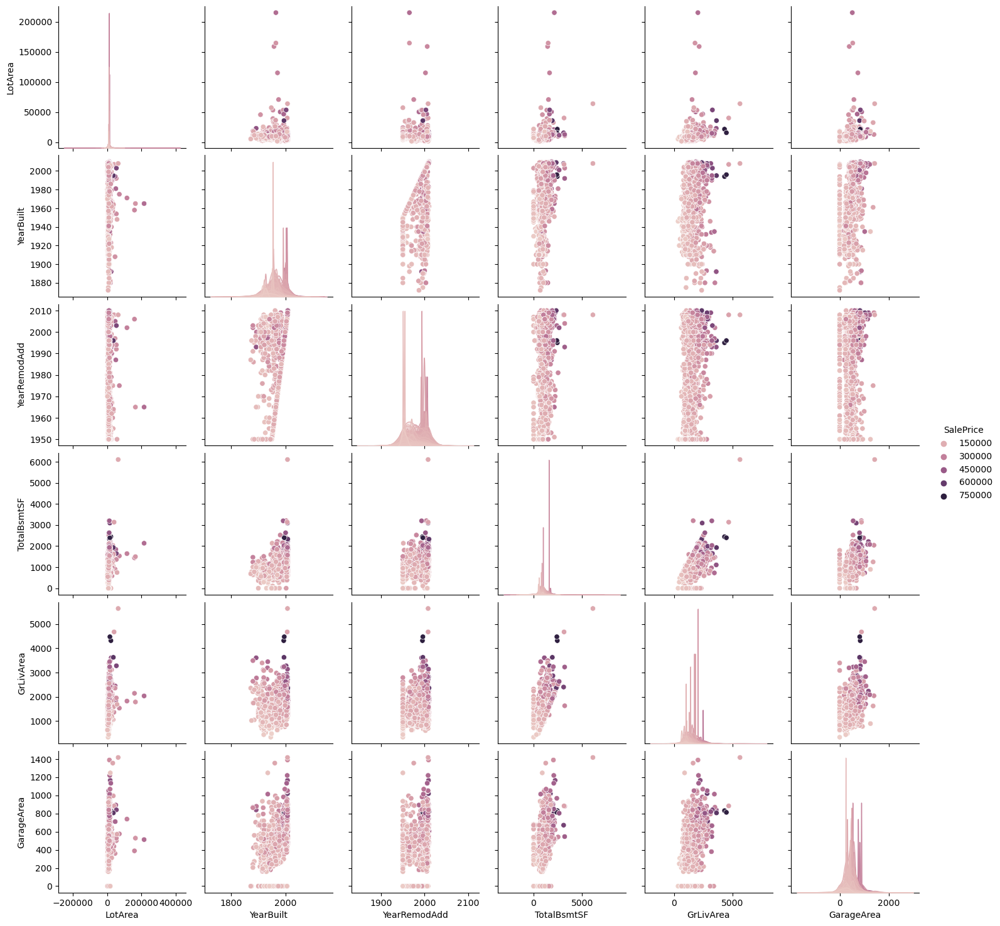

In [98]:
matplotlib.rc_file_defaults()
sns.pairplot(df[plot_cols] ,hue=target_col);

По графику видно, что большинство признаков имеет прямую зависимость с целевым признаком. Также хорошо заметно, что есть некоторое количество выбросов, которое необходимо обработать.

Исследуем силу связи между признаками с помощью анализа корреляционной матрицы

In [12]:
df.corr().style.background_gradient(cmap='coolwarm').set_precision(2)

,SalePrice,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,TotalBsmtSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageArea,Fence
SalePrice,1.00,0.26,0.79,-0.08,0.52,0.51,0.61,0.71,0.17,-0.14,0.53,0.47,0.62,-0.17
LotArea,0.26,1.00,0.11,-0.01,0.01,0.01,0.26,0.26,0.12,-0.02,0.19,0.27,0.18,-0.05
OverallQual,0.79,0.11,1.00,-0.09,0.57,0.55,0.54,0.59,0.10,-0.18,0.43,0.40,0.56,-0.19
OverallCond,-0.08,-0.01,-0.09,1.00,-0.38,0.07,-0.17,-0.08,0.01,-0.09,-0.06,-0.02,-0.15,0.17
YearBuilt,0.52,0.01,0.57,-0.38,1.00,0.59,0.39,0.20,-0.07,-0.17,0.10,0.15,0.48,-0.23
YearRemodAdd,0.51,0.01,0.55,0.07,0.59,1.00,0.29,0.29,-0.04,-0.15,0.19,0.11,0.37,-0.16
TotalBsmtSF,0.61,0.26,0.54,-0.17,0.39,0.29,1.00,0.45,0.05,-0.07,0.29,0.34,0.49,-0.12
GrLivArea,0.71,0.26,0.59,-0.08,0.20,0.29,0.45,1.00,0.52,0.10,0.83,0.46,0.47,-0.11
BedroomAbvGr,0.17,0.12,0.10,0.01,-0.07,-0.04,0.05,0.52,1.00,0.20,0.68,0.11,0.07,0.03
KitchenAbvGr,-0.14,-0.02,-0.18,-0.09,-0.17,-0.15,-0.07,0.10,0.20,1.00,0.26,-0.12,-0.06,-0.06


Итак, достаточно сильную связь с целевой переменной (SalePrice) имеют такие признаки, как OverallQual (общая оценка состояния дома), YearBuilt (год постройки дома), YearRemodAdd (год капитального ремонта), TotalBsmtSF (общая площадь подвала), GrLivArea (жилая площадь), TotRmsAbvGrd (общее кол-во комнат выше подвала) и GarageArea (площадь гаража).
Среди факторных признаков тесная связь заметна между TotRmsAbvGrd (общее количество комнат выше подвала) и GrLivArea (жилая площадь), между BedroomAbvGr (спальни выше подвала) и TotRmsAbvGrd (общее количество комнат выше подвала).

Исследуем силу связи между результирующим признаком (SalePrice) и категориальными признаками.

In [13]:
price_cat_df = pd.concat([df[cat_cols], df.SalePrice], axis=1)

In [14]:
price_cat_df.head()

,MSZoning,Utilities,Condition1,Condition2,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,Heating,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,SalePrice
0,RL,AllPub,Norm,Norm,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,GasA,Ex,Gd,No,TA,TA,208500
1,RL,AllPub,Feedr,Norm,Gable,CompShg,MetalSd,MetalSd,TA,TA,CBlock,Gd,TA,GasA,Ex,TA,TA,TA,TA,181500
2,RL,AllPub,Norm,Norm,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,GasA,Ex,Gd,TA,TA,TA,223500
3,RL,AllPub,Norm,Norm,Gable,CompShg,Wd Sdng,Wd Shng,TA,TA,BrkTil,TA,Gd,GasA,Gd,Gd,Gd,TA,TA,140000
4,RL,AllPub,Norm,Norm,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,GasA,Ex,Gd,TA,TA,TA,250000


In [15]:
price_cat_df['SalePriceInterval'] = pd.cut(price_cat_df.SalePrice, [34899, 400000, 800000])

In [16]:
price_cat_df.head()

,MSZoning,Utilities,Condition1,Condition2,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,...,BsmtQual,BsmtCond,Heating,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,SalePrice,SalePriceInterval
0,RL,AllPub,Norm,Norm,Gable,CompShg,VinylSd,VinylSd,Gd,TA,...,Gd,TA,GasA,Ex,Gd,No,TA,TA,208500,"(34899, 400000]"
1,RL,AllPub,Feedr,Norm,Gable,CompShg,MetalSd,MetalSd,TA,TA,...,Gd,TA,GasA,Ex,TA,TA,TA,TA,181500,"(34899, 400000]"
2,RL,AllPub,Norm,Norm,Gable,CompShg,VinylSd,VinylSd,Gd,TA,...,Gd,TA,GasA,Ex,Gd,TA,TA,TA,223500,"(34899, 400000]"
3,RL,AllPub,Norm,Norm,Gable,CompShg,Wd Sdng,Wd Shng,TA,TA,...,TA,Gd,GasA,Gd,Gd,Gd,TA,TA,140000,"(34899, 400000]"
4,RL,AllPub,Norm,Norm,Gable,CompShg,VinylSd,VinylSd,Gd,TA,...,Gd,TA,GasA,Ex,Gd,TA,TA,TA,250000,"(34899, 400000]"


In [17]:
df_lst = []
for i in price_cat_df.columns[:-2]:
    cont_table = pd.crosstab(price_cat_df[i], price_cat_df['SalePriceInterval'])
    df_lst.append(cont_table)

In [18]:
for df_cat in df_lst:
    display(df_cat)

SalePriceInterval,"(34899, 400000]","(400000, 800000]"
MSZoning,,
C (all),10,0
FV,65,0
RH,16,0
RL,1124,27
RM,217,1


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
Utilities,,
AllPub,1431,28
NoSeWa,1,0


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
Condition1,,
Artery,47,1
Feedr,81,0
Norm,1234,26
PosA,8,0
PosN,19,0
RRAe,11,0
RRAn,25,1
RRNe,2,0
RRNn,5,0


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
Condition2,,
Artery,2,0
Feedr,6,0
Norm,1417,28
PosA,1,0
PosN,2,0
RRAe,1,0
RRAn,1,0
RRNn,2,0


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
RoofStyle,,
Flat,13,0
Gable,1131,10
Gambrel,11,0
Hip,268,18
Mansard,7,0
Shed,2,0


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
RoofMatl,,
ClyTile,1,0
CompShg,1408,26
Membran,1,0
Metal,1,0
Roll,1,0
Tar&Grv,11,0
WdShake,5,0
WdShngl,4,2


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
Exterior1st,,
AsbShng,20,0
AsphShn,1,0
BrkComm,2,0
BrkFace,49,1
CBlock,1,0
CemntBd,55,6
HdBoard,220,2
ImStucc,1,0
MetalSd,220,0


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
Exterior2nd,,
AsbShng,20,0
AsphShn,3,0
Brk Cmn,7,0
BrkFace,24,1
CBlock,1,0
CmentBd,55,5
HdBoard,205,2
ImStucc,9,1
MetalSd,214,0


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
ExterQual,,
Ex,36,16
Fa,14,0
Gd,476,12
TA,906,0


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
ExterCond,,
Ex,3,0
Fa,28,0
Gd,144,2
Po,1,0
TA,1256,26


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
Foundation,,
BrkTil,145,1
CBlock,633,1
PConc,621,26
Slab,24,0
Stone,6,0
Wood,3,0


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
BsmtQual,,
Ex,99,22
Fa,35,0
Gd,613,5
No,37,0
TA,648,1


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
BsmtCond,,
Fa,45,0
Gd,63,2
No,37,0
Po,2,0
TA,1285,26


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
Heating,,
Floor,1,0
GasA,1400,28
GasW,18,0
Grav,7,0
OthW,2,0
Wall,4,0


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
HeatingQC,,
Ex,713,28
Fa,49,0
Gd,241,0
Po,1,0
TA,428,0


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
KitchenQual,,
Ex,79,21
Fa,39,0
Gd,579,7
TA,735,0


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
FireplaceQu,,
Ex,17,7
Fa,33,0
Gd,365,15
No,690,0
Po,20,0
TA,307,6


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
GarageQual,,
Ex,2,1
Fa,48,0
Gd,14,0
No,81,0
Po,3,0
TA,1284,27


SalePriceInterval,"(34899, 400000]","(400000, 800000]"
GarageCond,,
Ex,2,0
Fa,35,0
Gd,9,0
No,81,0
Po,7,0
TA,1298,28


H0: независимость наблюдаемых частот в таблице

alpha = 0.05

In [19]:
def highlight_greaterthan_1(s):
    if s.pvalue < 0.05:
        return ['background-color: forestgreen']*2 
    else:
        return ['background-color: orangered']*2

In [20]:
chi2_result = pd.DataFrame()
chi2_result['index'] = price_cat_df.columns[:-2]
chi2_result = chi2_result.set_index('index')
chi2_result.index.name = None
for df_cat in df_lst:
    result = stats.chi2_contingency(df_cat)
    chi2_result.at[df_cat.index.name, 'statistic'] = result[0]
    chi2_result.at[df_cat.index.name, 'pvalue'] = result[1]

chi2_result = round(chi2_result, 2)

chi2_result.style.apply(highlight_greaterthan_1, axis=1)

,statistic,pvalue
MSZoning,5.370000,0.250000
Utilities,12.300000,0.000000
Condition1,3.130000,0.930000
Condition2,0.300000,1.000000
RoofStyle,36.340000,0.000000
RoofMatl,31.960000,0.000000
Exterior1st,35.710000,0.000000
Exterior2nd,34.230000,0.000000
ExterQual,248.860000,0.000000
ExterCond,0.940000,0.920000


Целевая переменная SalePrice с категориальными признаками, для которых в таблице значения статистики и p-value подсвечены зеленым цветом (p-value < 0.05) имеют сильную связь, т.е. гипотеза H0 о независимости наблюдаемых частот в таблице кросс-табуляции для целевой переменной и соответствующих факторных переменных отклоняется.
Для категориальных переменных, подсвеченных красным цветом, наоборот, гипотеза H0 не отклоняется, т.е. мы не можем утверждать, что такие признаки, как MSZoning (тип локации), Condition1 (расположенный рядом объект), Condition2 (еще один расположенный рядом объект), ExterCond (состояние отделки), BsmtCond (состояние подвала), Heating (тип отопления) и GarageCond (состояние гаража) имеют тесную связь с SalePrice (значимо влияют на цену продажи жилья).

/Users/dasha/Library/Python/3.9/lib/python/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


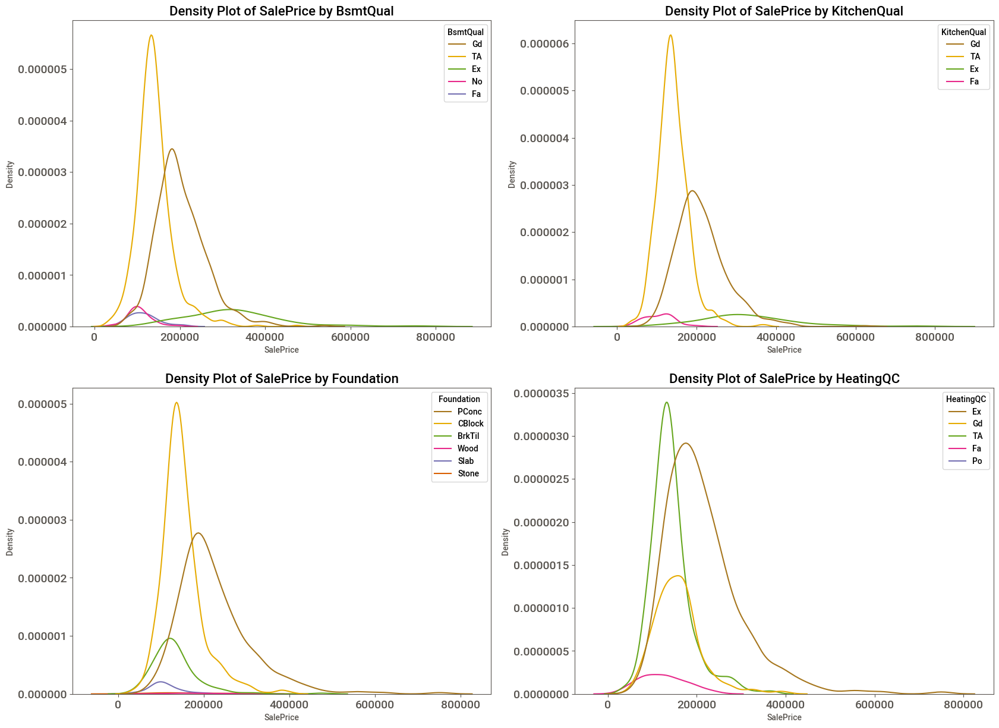

In [21]:
sns.set_palette('Dark2_r')
fig, ax = plt.subplots(2, 2, figsize=[20, 15])

ax[0,0].set_title('Density Plot of SalePrice by BsmtQual', size=16)
ax[1,0].set_title('Density Plot of SalePrice by Foundation', size=16)

ax[0,1].set_title('Density Plot of SalePrice by KitchenQual', size=16)
ax[1,1].set_title('Density Plot of SalePrice by HeatingQC', size=16)

for i, k in zip(range(2), ['BsmtQual', 'Foundation']):
    sns.kdeplot(price_cat_df['SalePrice'], hue = price_cat_df[k], ax=ax[i,0]); 
    

for i, k in zip(range(2), ['KitchenQual', 'HeatingQC']):
    sns.kdeplot(price_cat_df['SalePrice'], hue = price_cat_df[k], shade = False, ax=ax[i,1]); 

ax[0,0].tick_params(axis='both', which='major', labelsize=14)
ax[0,1].tick_params(axis='both', which='major', labelsize=14)
ax[1,0].tick_params(axis='both', which='major', labelsize=14)
ax[1,1].tick_params(axis='both', which='major', labelsize=14)
    

На представленном графики изображены распределения SalePrice в зависимости от BsmtQual (качества подвала), KitchenQual (качества кухни), Foundation (типа фундамента) и HeatingQC (качества отопления). 
Видно, что отобранные категориальные признаки оказывают существенное влияние на  целевую переменную SalePrice. К примеру, по первому графику, дома с отличным качеством подвала (100+ дюймов) чаще имеют более высокую цену продажи, чем дома с типичным качеством подвала (80-89 дюймов).
По второму графику, с качеством кухни наблюдается похожая ситуация.
По третьему графику, дома, имеющие в качестве фундамента заливной бетон чаще продаются по более высокой цене, чем дома, где фундамент состоит из кирпича и плитки, древесины, шлакоблоков или камня.
По четвертому графику, с качеством отопления похожая ситуация, как и в первых двух случаях, чаще бОльшую цену продажи имеют дома с отличным качеством отопления, чем дома с плохим отоплением, что логично.

Используя Kruskal–Wallis test, проверим, равны ли медианы цен продажи жилья для групп, разделенных по значениям категориальных признаков, для которых мы получили, что они имеют значимое влияние на цену продажи жилья.

In [22]:
kruskal_result = pd.DataFrame()
kruskal_result['index'] = ['RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'Foundation', 'ExterQual', 'BsmtQual',
                            'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageQual']
kruskal_result = kruskal_result.set_index('index')
kruskal_result.index.name = None

for column in kruskal_result.index[5:]:
    result = stats.kruskal(price_cat_df[price_cat_df[column] == "Ex"]['SalePrice'], price_cat_df[price_cat_df[column] == "Gd"]['SalePrice'],     
    price_cat_df[price_cat_df[column] == "TA"]['SalePrice'], price_cat_df[price_cat_df[column] == "Fa"]['SalePrice'])
    kruskal_result.at[column, 'statistic'] = result[0]
    kruskal_result.at[column, 'pvalue'] = result[1]

result1 = stats.kruskal(price_cat_df.query('RoofStyle == "Flat"')['SalePrice'], price_cat_df.query('RoofStyle == "Gable"')['SalePrice'],     
price_cat_df.query('RoofStyle == "Gambrel"')['SalePrice'], price_cat_df.query('RoofStyle == "Hip"')['SalePrice'], price_cat_df.query('RoofStyle == "Mansard"')['SalePrice'],     
price_cat_df.query('RoofStyle == "Shed"')['SalePrice'], price_cat_df.query('RoofStyle == "Mansard"')['SalePrice'])
kruskal_result.at['RoofStyle', 'statistic'] = result1[0]
kruskal_result.at['RoofStyle', 'pvalue'] = result1[1]

result2 = stats.kruskal(price_cat_df.query('RoofMatl == "CompShg"')['SalePrice'], price_cat_df.query('RoofMatl == "Tar&Grv"')['SalePrice'],     
price_cat_df.query('RoofMatl == "WdShngl"')['SalePrice'], price_cat_df.query('RoofMatl == "WdShake"')['SalePrice'], 
price_cat_df.query('RoofMatl == "Membran"')['SalePrice'], price_cat_df.query('RoofMatl == "Roll"')['SalePrice'],     
price_cat_df.query('RoofMatl == "Metal"')['SalePrice'], price_cat_df.query('RoofMatl == "ClyTile"')['SalePrice'])
kruskal_result.at['RoofMatl', 'statistic'] = result2[0]
kruskal_result.at['RoofMatl', 'pvalue'] = result2[1]

result3 = stats.kruskal(price_cat_df.query('Foundation == "PConc"')['SalePrice'], price_cat_df.query('Foundation == "CBlock"')['SalePrice'],     
price_cat_df.query('Foundation == "BrkTil"')['SalePrice'], price_cat_df.query('Foundation == "Slab"')['SalePrice'], 
price_cat_df.query('Foundation == "Stone"')['SalePrice'], price_cat_df.query('Foundation == "Wood"')['SalePrice'])    
kruskal_result.at['Foundation', 'statistic'] = result3[0]
kruskal_result.at['Foundation', 'pvalue'] = result3[1]

result4 = stats.kruskal(price_cat_df.query('Exterior1st == "VinylSd"')['SalePrice'], price_cat_df.query('Exterior1st == "HdBoard"')['SalePrice'],     
price_cat_df.query('Exterior1st == "MetalSd"')['SalePrice'], price_cat_df.query('Exterior1st == "Wd Sdng"')['SalePrice'], 
price_cat_df.query('Exterior1st == "Plywood"')['SalePrice'], price_cat_df.query('Exterior1st == "CemntBd"')['SalePrice'],     
price_cat_df.query('Exterior1st == "BrkFace"')['SalePrice'], price_cat_df.query('Exterior1st == "WdShing"')['SalePrice'],     
price_cat_df.query('Exterior1st == "Stucco"')['SalePrice'], price_cat_df.query('Exterior1st == "AsbShng"')['SalePrice'])    
kruskal_result.at['Exterior1st', 'statistic'] = result4[0]
kruskal_result.at['Exterior1st', 'pvalue'] = result4[1]

result5 = stats.kruskal(price_cat_df.query('Exterior2nd == "VinylSd"')['SalePrice'], price_cat_df.query('Exterior2nd == "MetalSd"')['SalePrice'],     
price_cat_df.query('Exterior2nd == "HdBoard"')['SalePrice'], price_cat_df.query('Exterior2nd == "Wd Sdng"')['SalePrice'], 
price_cat_df.query('Exterior2nd == "Plywood"')['SalePrice'], price_cat_df.query('Exterior2nd == "CmentBd"')['SalePrice'],     
price_cat_df.query('Exterior2nd == "Wd Shng"')['SalePrice'], price_cat_df.query('Exterior2nd == "Stucco"')['SalePrice'],
price_cat_df.query('Exterior2nd == "BrkFace"')['SalePrice'], price_cat_df.query('Exterior2nd == "AsbShng"')['SalePrice'])    
kruskal_result.at['Exterior2nd', 'statistic'] = result5[0]
kruskal_result.at['Exterior2nd', 'pvalue'] = result5[1]

kruskal_result = round(kruskal_result, 2)
kruskal_result.style.apply(highlight_greaterthan_1, axis=1)

,statistic,pvalue
RoofStyle,40.070000,0.000000
RoofMatl,18.870000,0.010000
Exterior1st,291.370000,0.000000
Exterior2nd,275.870000,0.000000
Foundation,488.720000,0.000000
ExterQual,683.440000,0.000000
BsmtQual,631.830000,0.000000
HeatingQC,354.670000,0.000000
KitchenQual,661.480000,0.000000
FireplaceQu,50.430000,0.000000


Действительно, при изменении значений данных категориальных признаков, медианные значения цены продажи значимо меняется (гипотеза H0 о том, что медианы цены продажи жилья при разных значениях категориальных признаков, представленных в таблице выше, равны, отвергается).

В качестве примера визуализируем распределение цены продажи жилья в зависимости от значений отобранных 4ех категориальных признаков (RoofStyle, KitchenQual, Foundation, BsmtQual).

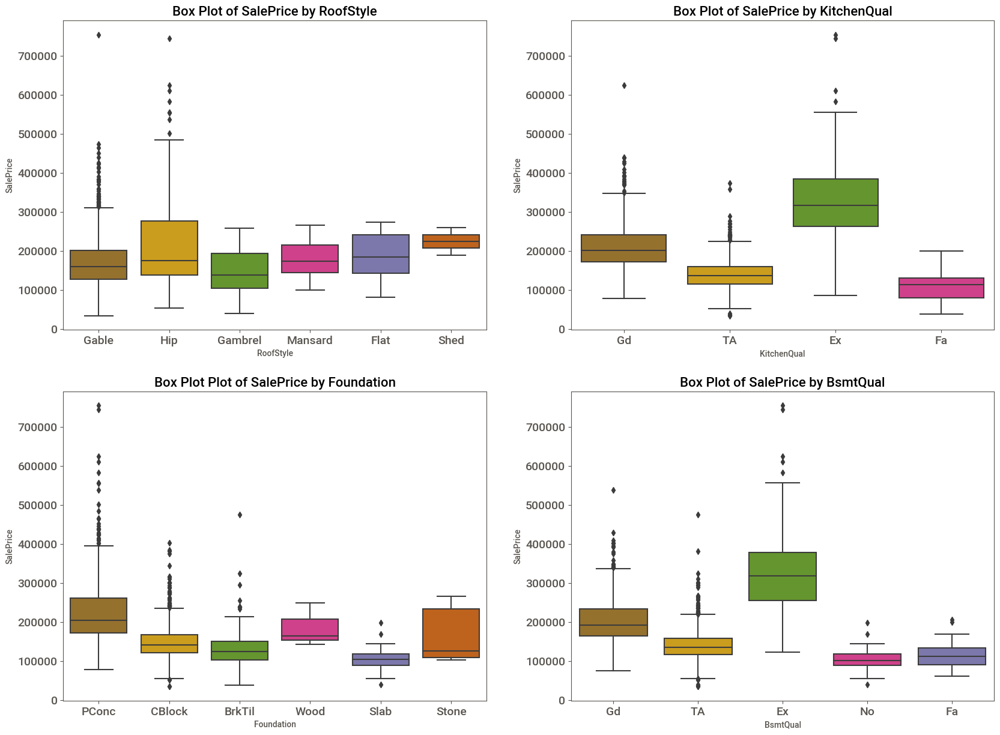

In [23]:
sns.set_palette('Dark2_r')
fig, ax = plt.subplots(2, 2, figsize=[20, 15])

ax[0,0].set_title('Box Plot of SalePrice by RoofStyle', size=16)
ax[1,0].set_title('Box Plot Plot of SalePrice by Foundation', size=16)

ax[0,1].set_title('Box Plot of SalePrice by KitchenQual', size=16)
ax[1,1].set_title('Box Plot of SalePrice by BsmtQual', size=16)

for i, k in zip(range(2), ['RoofStyle', 'Foundation']):
    sns.boxplot(x=k, y='SalePrice', data=price_cat_df, ax=ax[i, 0]);
    

for i, k in zip(range(2), ['KitchenQual', 'BsmtQual']):
    sns.boxplot(x=k, y='SalePrice', data=price_cat_df, ax=ax[i, 1]);

ax[0,0].tick_params(axis='both', which='major', labelsize=14)
ax[0,1].tick_params(axis='both', which='major', labelsize=14)
ax[1,0].tick_params(axis='both', which='major', labelsize=14)
ax[1,1].tick_params(axis='both', which='major', labelsize=14)


По графикам box plot также заметно, что медианы цены продажи значительно изменяются при изменении значения категориального признака. Например, для признаков KitchenQual и BsmtQual, медиана цены продажи жилья с отличным состоянием кухни или с высотой подвала более 100 дюймов значительно превышает медианные значения цен для домов с более низким состоянием кухни или с меньшей высотой подвала.

---
1.4. Анализ признаков на нормальность распределения

---

Проведем анализ распределения числовых признаков 'SalePrice', 'LotArea', 'TotalBsmtSF', 'GrLivArea' и 'GarageArea'.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/sit

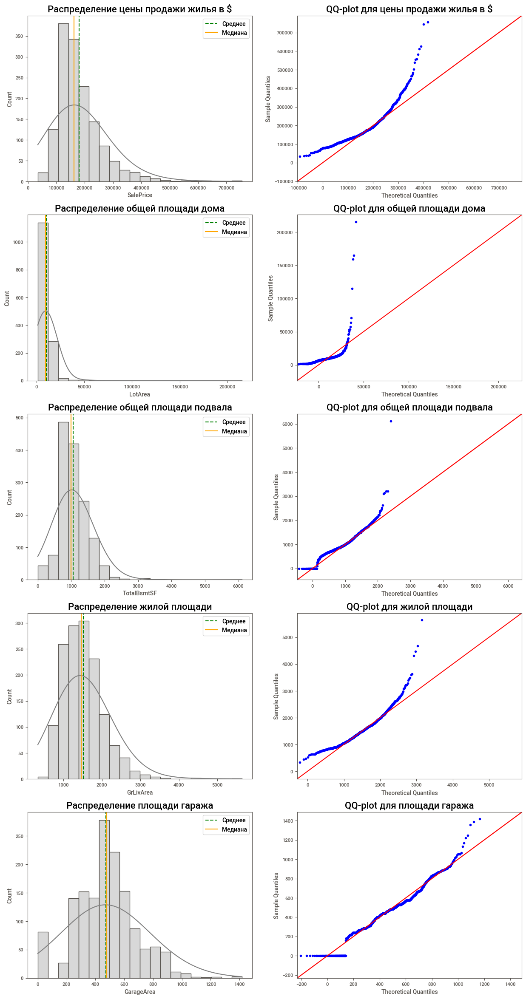

In [24]:
fig, ax = plt.subplots(5, 2, figsize=[15, 30])

ax[0,0].set_title('Распределение цены продажи жилья в $', size=16)
ax[1,0].set_title('Распределение общей площади дома', size=16)
ax[2,0].set_title('Распределение общей площади подвала', size=16)
ax[3,0].set_title('Распределение жилой площади', size=16)
ax[4,0].set_title('Распределение площади гаража', size=16)

ax[0,1].set_title('QQ-plot для цены продажи жилья в $', size=16)
ax[1,1].set_title('QQ-plot для общей площади дома', size=16)
ax[2,1].set_title('QQ-plot для общей площади подвала', size=16)
ax[3,1].set_title('QQ-plot для жилой площади', size=16)
ax[4,1].set_title('QQ-plot для площади гаража', size=16)

for i, k in zip(range(5), ['SalePrice', 'LotArea', 'TotalBsmtSF', 'GrLivArea', 'GarageArea']):
    sns.histplot(df[k], bins=20, kde=True, kde_kws={'bw_adjust': 5}, color='gray', alpha=0.3, ax=ax[i,0])
    ax[i,0].axvline(x=df[k].mean(), color='green', linestyle='--')
    ax[i,0].axvline(x=df[k].median(), color='orange', linestyle='-')
    ax[i,0].legend([Line2D([0], [0], color='green', linestyle='--'),
            Line2D([0], [0], color='orange', linestyle='-')],
            ['Среднее',
            'Медиана'])

for i, k in zip(range(5), ['SalePrice', 'LotArea', 'TotalBsmtSF', 'GrLivArea', 'GarageArea']):
    sm.qqplot(df[k], stats.norm(df[k].median(), df[k].std()), line='45', marker='o', ax=ax[i,1]);



На основе визуального анализа распределения отобранных числовых признаков можно заключить, что они распределены ненормально – присутствует асимметрия распределения.
Данный факт также подтверждают графики QQ-plot – точки сильно отклоняются от базовой линии, проходящей под углом 45 градусов.

Подтвердим заключение о ненормальности распределения признаков, сделанное на основе построенных графиков, расчетом показателей асимметрии и эксцесса.

In [25]:
skkur = pd.DataFrame()
skkur['index'] = ['skew', 'kurtosis']
for i in ['SalePrice', 'LotArea', 'TotalBsmtSF', 'GrLivArea', 'GarageArea']:
    skkur[i] = [stats.skew(df[i]), stats.kurtosis(df[i])]
skkur.set_index('index', inplace=True)
skkur.index.name = None
skkur = skkur.round(2)
skkur.style.set_caption('Показатели асимметрии и эксцесса')


,SalePrice,LotArea,TotalBsmtSF,GrLivArea,GarageArea
skew,1.880000,12.200000,1.520000,1.370000,0.180000
kurtosis,6.510000,202.540000,13.200000,4.870000,0.910000


Рассчитанные показатели асимметрии и эксцесса также свидетельсвуют о том, что практически все признаки распределены ненормально – показатели не близки к нулю.
Однако, для признака GarageArea значение показателя асимметрии (0,18) достаточно близко к нулю, поэтому стоит осуществить проверку статистических гипотез в предположении нормальности распределения данных признаков.

Проверка гипотез о нормальности распределения признаков с помощью теста Колмогорова-Смирнова.

H0: признак имеет нормальное распределение

alpha = 0.05 (уровень значимости)

In [26]:
shapiro_test = pd.DataFrame()
shapiro_test['index'] = ['statistic', 'p-value']
for i in ['SalePrice', 'LotArea', 'TotalBsmtSF', 'GrLivArea', 'GarageArea']:
    shapiro_test[i] = [stats.kstest(df[i], 'norm')[0], stats.kstest(df[i], 'norm')[1]]
shapiro_test.set_index('index', inplace=True)
shapiro_test.index.name = None
shapiro_test = round(shapiro_test, 2)
shapiro_test.style.set_caption('Результаты проверки гипотез о нормальности распределения признаков')

,SalePrice,LotArea,TotalBsmtSF,GrLivArea,GarageArea
statistic,1.000000,1.000000,0.970000,1.000000,0.940000
p-value,0.000000,0.000000,0.000000,0.000000,0.000000


Для всех 5ти переменных гипотеза H0 о нормальности распределения отвергается, все из указанных 5ти переменных распределены ненормально (pvalue<0.05).

Попробуем преобразовать отобранные признаки путем логарифмирования (+1), посмотреть на распределение и осуществить проверку на нормальность.

In [27]:
log_part_df = pd.DataFrame({'SalePrice_log1p' : np.log1p(df['SalePrice'] * 10**6),
                            'LotArea_log1p' : np.log1p(df['LotArea'] * 10**6), 
                            'GrLivArea_log1p' : np.log1p(df['GrLivArea'] * 10**6),     
                            'GarageArea_log1p' : np.log1p(df['GarageArea'] * 10**6),
                            'TotalBsmtSF_log1p' : np.log1p(df['TotalBsmtSF'] * 10**6)})

In [28]:
log_part_df.head()

,SalePrice_log1p,LotArea_log1p,GrLivArea_log1p,GarageArea_log1p,TotalBsmtSF_log1p
0,26.063205,22.857432,21.259759,20.121786,20.567781
1,25.924521,22.985029,20.955964,19.946737,20.955964
2,26.132677,23.143634,21.303244,20.225685,20.639884
3,25.664908,22.979807,21.263844,20.280099,20.443552
4,26.244727,23.380724,21.510814,20.544139,20.858670


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/sit

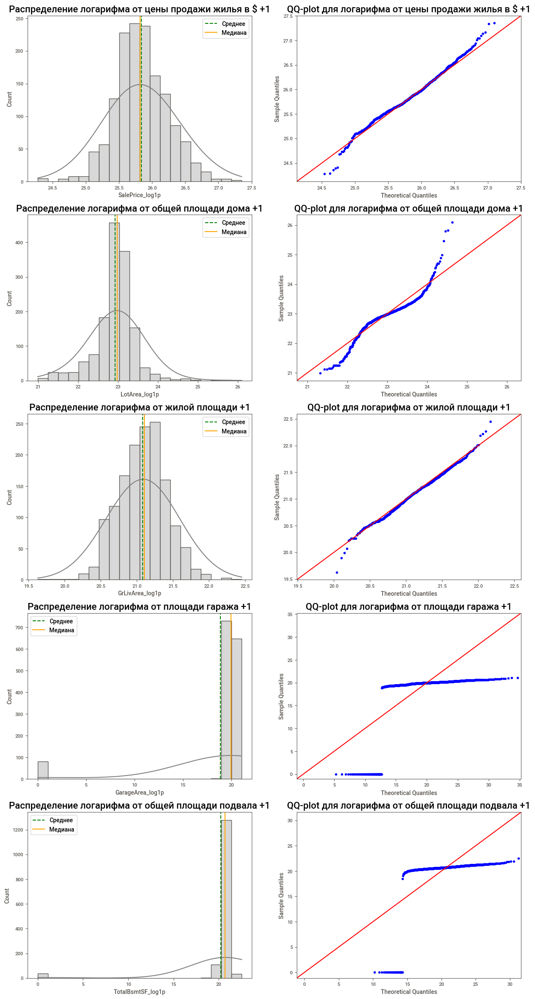

In [29]:
fig, ax = plt.subplots(5, 2, figsize=[15, 30])

ax[0,0].set_title('Распределение логарифма от цены продажи жилья в $ +1', size=16)
ax[1,0].set_title('Распределение логарифма от общей площади дома +1', size=16)
ax[2,0].set_title('Распределение логарифма от жилой площади +1', size=16)
ax[3,0].set_title('Распределение логарифма от площади гаража +1', size=16)
ax[4,0].set_title('Распределение логарифма от общей площади подвала +1', size=16)

ax[0,1].set_title('QQ-plot для логарифма от цены продажи жилья в $ +1', size=16)
ax[1,1].set_title('QQ-plot для логарифма от общей площади дома +1', size=16)
ax[2,1].set_title('QQ-plot для логарифма от жилой площади +1', size=16)
ax[3,1].set_title('QQ-plot для логарифма от площади гаража +1', size=16)
ax[4,1].set_title('QQ-plot для логарифма от общей площади подвала +1', size=16)

for i, k in zip(range(5), ['SalePrice_log1p', 'LotArea_log1p', 'GrLivArea_log1p', 'GarageArea_log1p', 'TotalBsmtSF_log1p']):
    sns.histplot(log_part_df[k], bins=20, kde=True, kde_kws={'bw_adjust': 5}, color='gray', alpha=0.3, ax=ax[i,0])
    ax[i,0].axvline(x=log_part_df[k].mean(), color='green', linestyle='--')
    ax[i,0].axvline(x=log_part_df[k].median(), color='orange', linestyle='-')
    ax[i,0].legend([Line2D([0], [0], color='green', linestyle='--'),
            Line2D([0], [0], color='orange', linestyle='-')],
            ['Среднее',
            'Медиана'])

for i, k in zip(range(5), ['SalePrice_log1p', 'LotArea_log1p', 'GrLivArea_log1p', 'GarageArea_log1p', 'TotalBsmtSF_log1p']):
    sm.qqplot(log_part_df[k], stats.norm(log_part_df[k].median(), log_part_df[k].std()), line='45', marker='o', ax=ax[i,1]);

На основе визуального анализа распределения логарифмов от отобранных числовых признаков +1 можно заключить, что они скорее распределены ненормально – присутствует асимметрия распределения и выбросы. Хотя графики логарифмов от цены продажи жилья +1 и от общей площади подвала +1 имеют большое сходство с нормальным. Поэтому стоит проверить данное предположение посредством анализа асимметрии и эксцесса, а также проверки статистических гипотез.
Факт того, что логарифмы признаков +1 скорее распределены ненормально, чем наоборот, также подтверждают графики QQ-plot – точки сильно отклоняются от базовой линии, проходящей под углом 45 градусов (особенно для логарифма от общей площади дома, логарифма от площади гаража +1 и логарифма от жилой площади +1).

Анализ показателей асимметрии и эксцесса

In [30]:
skkur_log = pd.DataFrame()
skkur_log['index'] = ['skew', 'kurtosis']
for i in ['SalePrice_log1p', 'LotArea_log1p', 'GrLivArea_log1p', 'GarageArea_log1p', 'TotalBsmtSF_log1p']:
    skkur_log[i] = [stats.skew(log_part_df[i]), stats.kurtosis(log_part_df[i])]
skkur_log.set_index('index', inplace=True)
skkur_log.index.name = None
skkur_log = skkur_log.round(2)
skkur_log.style.set_caption('Показатели асимметрии и эксцесса')

,SalePrice_log1p,LotArea_log1p,GrLivArea_log1p,GarageArea_log1p,TotalBsmtSF_log1p
skew,0.120000,-0.140000,-0.010000,-3.840000,-5.930000
kurtosis,0.800000,4.690000,0.280000,12.880000,33.610000


Итак, показатели асимметрии и эксцесса для логарифма от цены продажи жилья +1 и логарифма от общей площади подвала подтвердили наше предположение о том, что данные переменные могут быть распределены нормально. Осталось подтвердить это предположение с помощью проверки статистичесих гипотез о нормальности распределения.

Проверка гипотез о нормальности распределения логарифмов признаков +1 с помощью теста Колмогорова-Смирнова.

H0: признак имеет нормальное распределение

alpha = 0.05 (уровень значимости)

In [31]:
shapiro_test = pd.DataFrame()
shapiro_test['index'] = ['statistic', 'p-value']
for i in ['SalePrice_log1p', 'LotArea_log1p', 'GrLivArea_log1p', 'GarageArea_log1p', 'TotalBsmtSF_log1p']:
    shapiro_test[i] = [stats.kstest(log_part_df[i], 'norm')[0], stats.kstest(log_part_df[i], 'norm')[1]]
shapiro_test.set_index('index', inplace=True)
shapiro_test.index.name = None
shapiro_test = round(shapiro_test, 2)
shapiro_test.style.set_caption('Результаты проверки гипотез о нормальности распределения признаков')

,SalePrice_log1p,LotArea_log1p,GrLivArea_log1p,GarageArea_log1p,TotalBsmtSF_log1p
statistic,1.000000,1.000000,1.000000,0.940000,0.970000
p-value,0.000000,0.000000,0.000000,0.000000,0.000000


Все представленные 5 логарифмов от переменных +1 распределены ненормально (гипотеза H0 о нормальности распределения отвергается, pvalue<0.05).

## Устранение выбросов

Для заполнение пропусков будем использовать LOF (Local Outlier Factor).  
<br/><br/>
<center> <font size="5">  Теоретическое отступление </font>  </center>
<br/><br/>
Метод является обучением без учителя в некотором смысле основан на Kmeans и похож на DBSCAN. Рассматриваются K ближайших соседа точек. k-distance - расстояние от объекта до k-го ближайшего соседа. При этом k-й ближайший сосед не обязательно единственный(несколько соседей могут лежать на окружности). Тогда определим досягаемость точки как $reachability$-$distance_k(A,B)=max\{k$-$distance(B), d(A,B)\}$ Принимается, что все ближайшие соседи расположены на одинаковом расстоянии и называются ядром. Тогда локальная плотность точки:! , где $N_k(A)$ - множество k ближайших соседей. Затем сравнивают локальные плотности точек и их соседей, что собственно и является LOFом <br/><br/>

LOF(k) ~ 1 - Плотность как у соседей  
LOF(k)< 1 - Плотность выше, чем у соседей, не выброс  
LOF(k) > 1 - Плотность ниже, чем у соседей - выброс  

Картинки почему-то постоянно отваливаются, а внешне не хотят вставляться, но и так понятно, в принципе

In [119]:
lof = LocalOutlierFactor()
outs = pd.Series(lof.fit_predict(df[num_cols]))

In [120]:
outs.value_counts()

 1    1394
-1      66
dtype: int64

Нашлось 94 выброса, уберем их

In [121]:
mask = outs != -1
df_cla = df[mask];

Посмотрим, как изменился pairplot.

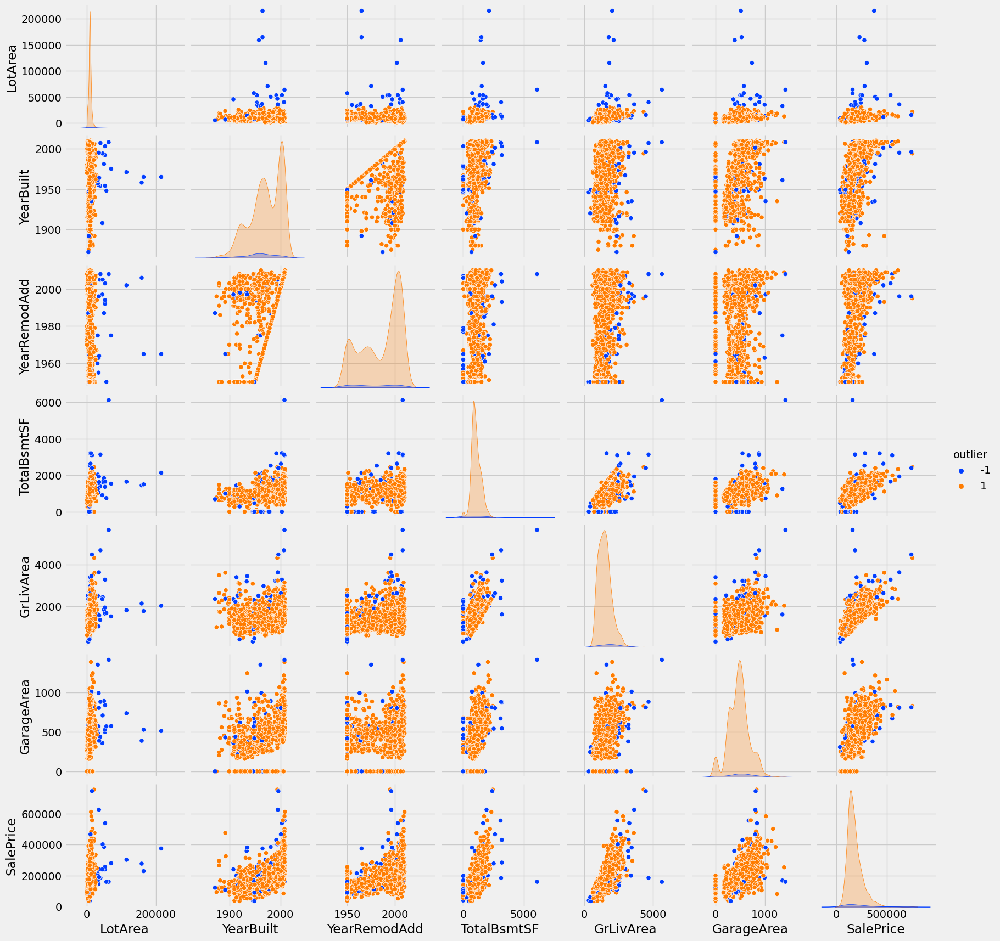

In [122]:
style.use('fivethirtyeight')
df_temp = df.copy()
df_temp['outlier'] = outs
sns.pairplot(df_temp[[*plot_cols, 'outlier']],hue = 'outlier', palette  = 'bright');

Действительно, похоже на правду, выбросы ушли

## Кодировка нечисловых признаков

Сгруппируем категориальные признаки для дальнейшей кодировки. Некоторые из них являются порядковыми, то есть по смыслу их можно ранжировать. Установим соответствие качества признака и числового значения. Отдельно в список запишем признаки, которые следует закодировать фиктивными переменными.

In [123]:
sorted_qu = {'Ex': 5, 'Gd': 4, 'TA':3, 'Fa': 2, 'Po': 1, 'No': 0}
sorted_util = {'AllPub':4, 'NoSewr': 3, 'NoSeWa': 2, 'ELO':1 }

onehot_cols = ['MSZoning', 'Condition1', 'Condition2',
          'RoofStyle', 'RoofMatl', 'Exterior1st',
          'Exterior2nd', 'Foundation', 'Heating']
qual_cols = ['ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'HeatingQC',
            'KitchenQual', 'FireplaceQu', 'GarageQual', 'GarageCond']


In [124]:
X = df_cla.copy()
X.drop('SalePrice', inplace = True, axis = 1)
for col in qual_cols:
    X[col].replace(sorted_qu, inplace = True)

In [125]:
dummies = pd.get_dummies(X[onehot_cols])
X.drop(onehot_cols, axis = 1, inplace = True)
X = pd.concat((X, dummies), axis = 1)
X['Utilities'].replace(sorted_util, inplace = True)

In [126]:
st_scaler = StandardScaler()
mm_scaler = MinMaxScaler()
scaler_num_st = StandardScaler()
scaler_num_mm = MinMaxScaler()

X_num = df_cla[num_cols]

X_st = st_scaler.fit_transform(X)
X_mm = mm_scaler.fit_transform(X)
X_num_st = scaler_num_st.fit_transform(X_num)
X_num_mm = scaler_num_mm.fit_transform(X_num)

X_list_names = ['X_st', 'X_mm', 'X_num_st', 'X_num_mm']

# Кластеризация

## K-means

Переберем модели K-means. Для удобства напишем класс. При инициализации класса на вход подается матрица признаков и итератор, который подает количество кластеров для модели. Применив метод plot_res к экземпляру, строятся график для Elbow и график силуэта.

In [127]:
class Kmeansselect:
    def __init__(self, X, clust_range):
        self.clust_range = clust_range
        self.X = X
        models = []
        for i in clust_range:
            model = KMeans(n_clusters = i, random_state = 54)
            model.fit_predict(X)
            models.append(model)
        inertia = [m.inertia_ for m in models]
        silhouette = [silhouette_score(X, m.labels_) for m in models]
        self.models = models
        self.inertia = inertia
        self.silhouette = silhouette

    def plot_res(self, title_add = ' ', fontsize = 16):
        inrt, silh = self.inertia, self.silhouette
        rng = list(self.clust_range)
        
        with plt.style.context('seaborn-darkgrid'):
            fig, axs = plt.subplots(1, 2, figsize = (14, 5))
            axs[0].plot(rng, inrt, marker='o', markerfacecolor='red')
            axs[1].plot(rng, silh, marker='o', markerfacecolor='red')
            
            axs[0].set_xlabel('Number of clusters')
            axs[1].set_xlabel('Number of clusters')
            axs[0].set_ylabel('Inertia value')
            axs[1].set_ylabel('Silhouette value')
            axs[0].set_title('Elbow method' + ' ' + title_add, fontsize = fontsize)
            axs[1].set_title('Silhouette'+ ' ' + title_add, fontsize = fontsize)
        

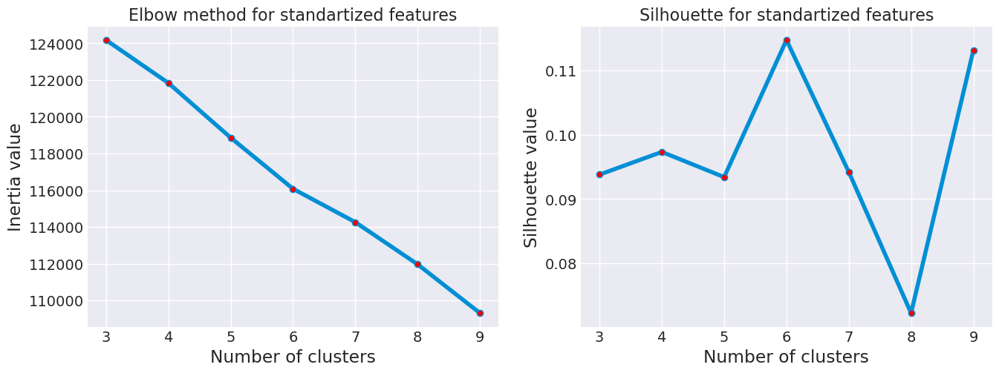

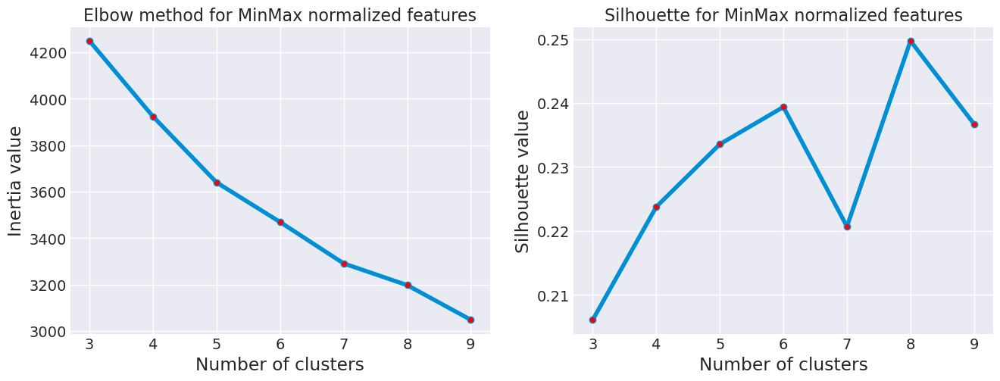

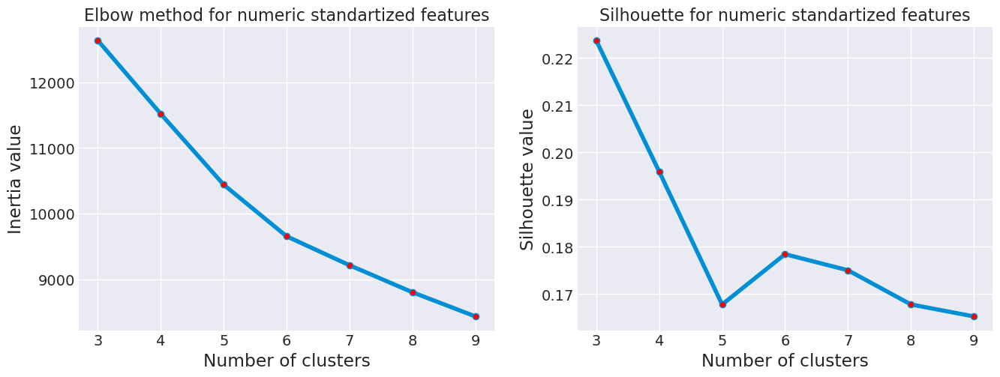

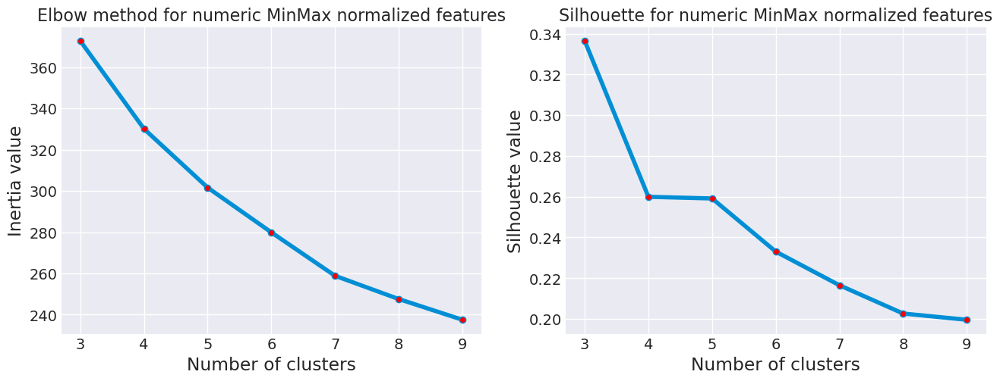

In [128]:
X_list = [X_st, X_mm, X_num_st, X_num_mm]
titles = ['for standartized features', 'for MinMax normalized features',
         'for numeric standartized features', 'for numeric MinMax normalized features']
Kmeansmodels = {}
for X, title, name in zip(X_list, titles, X_list_names):
    models = Kmeansselect(X, range(3, 10))
    Kmeansmodels[name] = models
    models.plot_res(title)

Значения силуэтов при такой кластеризации очень маленькое даже если учитывать только числовые признаки. MinMax нормализация дает результаты немного лучше, чем стандартизация. По методу локтя тяжело делать выводы о количестве кластеров. Кажется, что данные трудноразделимы.

In [129]:
def dn_plotter(X, title_add = '', multi = False, p = 50):
    if not multi :
        link = linkage(X, 'ward','euclidean')
        fig, ax = plt.subplots(figsize = (12,6))
        ax.set_title('Dendrogramm' + ' ' + title_add)
        ax.set_ylabel('Distance')
        dn = dendrogram(link, truncate_mode='lastp', p = p, ax = ax);
    else:
        with plt.style.context('default'):
            fig, axs = plt.subplots(int(math.ceil(len(X))/2), 2, figsize = (16, 5 * int(math.ceil(len(X))/2)))
            axs = np.array(axs)
            for ax, title, X_l in zip(axs.reshape(-1), title_add, X): 
                link = linkage(X_l, 'ward','euclidean')
                ax.set_title('Dendrogramm' + ' ' + title)
                ax.set_ylabel('Distance')
                dn = dendrogram(link, truncate_mode='lastp', p = p, ax = ax);
        

## Иерархическая кластеризация

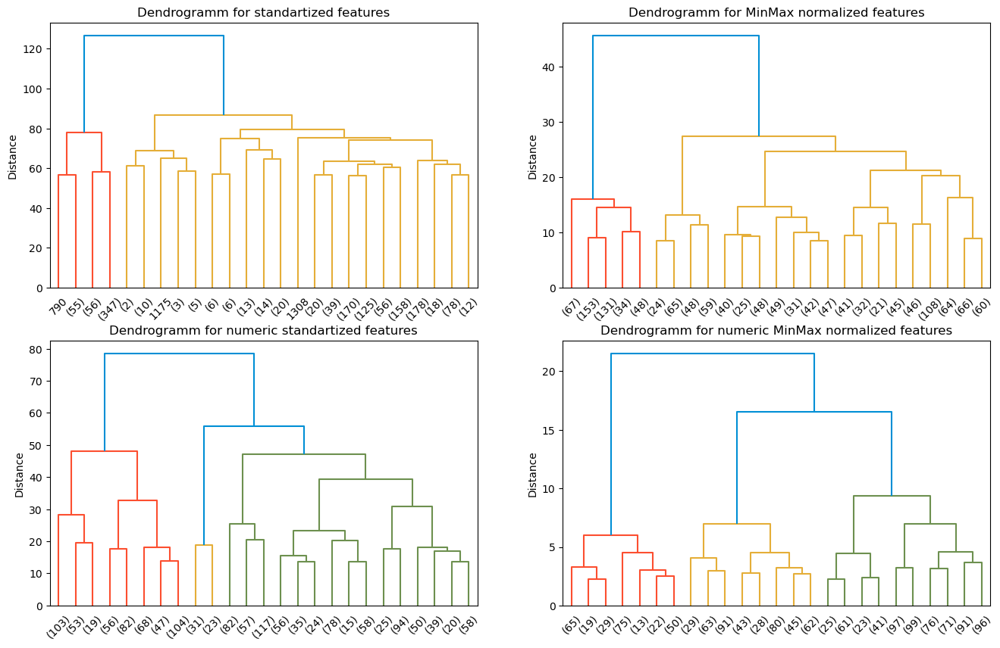

In [130]:
dn_plotter(X_list, multi = True, title_add = titles, p =25)

Дендрограмма нормально разделяется только для MinMax нормализованных числовых признаков.

## DBSCAN

Переберем параметры DBSCANа. Функция dbscan_ssearch перебирает все варианты поданных на вход eps и min_samples и возвращает таблицу с кластерами и количеством наблюдений, которые в них вошли.

In [131]:
from itertools import product
eps = [0.1, 0.25, 0.5, 1, 3]
min_samples = [5, 10, 25, 50, 75, 100]

In [132]:
def dbscan_search(eps, min_samples, X):
    rep = pd.DataFrame()
    DBSCAN_greed_iterator = product(eps, min_samples)
    for eps, min_samples in DBSCAN_greed_iterator:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        y_dbscan = dbscan.fit_predict(X)
        a = pd.Series(y_dbscan).value_counts()
        a.name = f'e = {str(eps)} msp = {str(min_samples)}'
        rep = pd.concat([rep, a], axis = 1)
    return rep

Переберем для всех вариантов обработки признаков кластеризацию DBSCANом для eps и min_samples выше. Для каждого массива X отберем такие сочетания параметров, чтобы в -1 попало менее 500 наблюдений, поскольку наблюдения, которые на выходе получают метку -1 считаются шумом.

In [133]:
dbs_tables = [dbscan_search(eps, min_samples, X) for eps, min_samples, X in zip([eps]*len(X_list), [min_samples]*len(X_list), X_list)]
dbs_tables_dict = {k:v for k, v in zip(X_list_names, dbs_tables)}

In [134]:
dbmasks = [(table.iloc[0] < 500).values for table in dbs_tables_dict.values()]
dbs_tables_real = [table.loc[:, dbmask].dropna(axis = 0, how = 'all') for table, dbmask in zip(dbs_tables, dbmasks)]
dbs_tables_dict_real = {k:v.loc[:, dbmask].dropna(axis = 0, how = 'all') for k, v, dbmask in zip(X_list_names, dbs_tables_dict.values(), dbmasks)}

In [135]:
for df in dbs_tables_real:
    display(df)

""


,e = 3 msp = 5,e = 3 msp = 10,e = 3 msp = 25,e = 3 msp = 50,e = 3 msp = 75,e = 3 msp = 100
-1,1.0,1.0,1.0,1.0,1.0,1.0
0,1393.0,1393.0,1393.0,1393.0,1393.0,1393.0


,e = 3 msp = 5,e = 3 msp = 10,e = 3 msp = 25,e = 3 msp = 50,e = 3 msp = 75,e = 3 msp = 100
-1,48.0,62.0,90.0,100.0,109.0,115.0
0,1314.0,1310.0,1304.0,1294.0,1285.0,1279.0
1,32.0,22.0,NaN,NaN,NaN,NaN


,e = 0.5 msp = 5,e = 0.5 msp = 10,e = 0.5 msp = 25,e = 0.5 msp = 50,e = 0.5 msp = 75,e = 0.5 msp = 100
-1,31.0,40.0,65.0,91.0,125.0,181.0
0,1106.0,1098.0,1077.0,1061.0,1049.0,1029.0
1,257.0,256.0,252.0,242.0,220.0,184.0


Из таблиц очевидно, что кластеризация получается не очень хорошая. Для X_st - всех стандартизованных признаков вообще не нашлось подходящего сочетания, а для остальных наборов данных получается 1-2 кластера.

# Понижение размерности

## PCA

Не будем долго останавливаться на PCA, им удается убрать около 30% признаков, сохраняя 95% дисперсии.

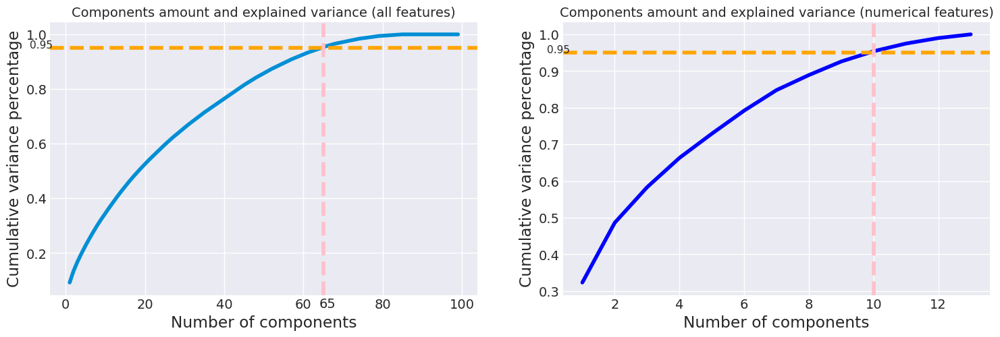

In [136]:
from sklearn.decomposition import PCA
pca_all = PCA()
pca_num = PCA()

PC_all, PC_num = pca_all.fit_transform(X_st), pca_num.fit_transform(X_num_st)
var_list_all = pca_all.explained_variance_ratio_.round(3)
var_list_num = pca_num.explained_variance_ratio_.round(3)

cum_all = var_list_all.cumsum()
cum_num = var_list_num.cumsum()

with plt.style.context('seaborn-darkgrid'):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 5))
    sns.lineplot(x = range(1, len(cum_all) + 1), y = cum_all, ax = ax1)
    sns.lineplot(x = range(1, len(cum_num) + 1), y = cum_num, ax = ax2, color='blue')

    ax1.set_title('Components amount and explained variance (all features)', fontsize=14)
    ax2.set_title('Components amount and explained variance (numerical features)', fontsize=14)
    ax1.axhline(0.95, ls='--', c = 'orange'), ax2.axhline(0.95, ls='--', c = 'orange')


    ax1.text(-9, 0.95, '0.95', fontsize = 11), ax2.text(-0.1, 0.95, '0.95', fontsize = 11)
    ax1.axvline(x = len(cum_all[cum_all <= 0.95]) + 1, ls='--', c = 'pink'), ax2.axvline(x = len(cum_num[cum_num <= 0.95]) + 1, ls='--', c = 'pink')
    ax1.text(len(cum_all[cum_all <= 0.95] + 1), 0, f'{len(cum_all[cum_all <= 0.95]) + 1}', fontsize = 14)

    ax1.set_ylabel('Cumulative variance percentage'), ax2.set_ylabel('Cumulative variance percentage')
    ax1.set_xlabel('Number of components'), ax2.set_xlabel('Number of components');

## UMAP и T-SNE

Переберем количество соседей для UMAP и T-SNE. И визуализируем результаты.

In [137]:
# t-SNE и UMAP
from sklearn.manifold import TSNE
from umap import UMAP

In [138]:
umap_n = [2, 5, 10, 15, 25, 50, 75, 100]
perplexity = [5, 10, 15, 25, 35, 50]

In [139]:
tsne_res = {}
for X, X_name in zip(X_list, X_list_names):
    X_res = {}
    for per in perplexity:
        X_tsne = TSNE(perplexity=per, random_state = 54).fit_transform(X)
        X_res['p = ' + str(per)] = X_tsne
    tsne_res[X_name] = X_res

In [140]:
umap_res = {}
old_settings = np.seterr(all = 'print')
for X, X_name in zip(X_list, X_list_names):
    X_res = {}
    for n in umap_n:
        X_umap = UMAP(n_neighbors=n, random_state = 54).fit_transform(X)
        X_res['n = ' + str(n)] = X_umap
    umap_res[X_name] = X_res

C:\Users\Eugene\anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
C:\Users\Eugene\anaconda3\lib\site-packages\umap\spectral.py:255: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


Функция low_dim_plot визуализирует многомерные данные, в том числе из списка массивов. Используем его для визуализации работы методов для разных значений perplexity для T-SNE и n_neighbours для UMAP. Визуально отберем 2 лучших результата.

In [141]:
def low_dim_plot(X, multi = False, clust = False, method = '', title_add = '', hue = None, par_list = None):
    if not multi :
        if clust :
            fig, ax = plt.subplots(figsize = (12,6))
            ax.set_title(title_add)
            ax.set_ylabel('Y2')
            ax.set_xlabel('Y1')
            plot = ax.scatter(X[:, 0], X[:, 1], c=hue, cmap = 'tab20b', alpha=0.5)
            ax.legend(*plot.legend_elements(), title='clusters')
        else:
            fig, ax = plt.subplots(figsize = (12,6))
            ax.set_title(method + par_list + 'dimensionality reduction' + title_add)
            ax.set_ylabel('Y2')
            ax.set_xlabel('Y1')
            ax.scatter(X[:, 0], X[:, 1], alpha=0.5)

    else:
        with plt.style.context('seaborn-darkgrid'):
            fig, axs = plt.subplots(int(math.ceil(len(X))/2), 2, figsize = (16, 5 * int(math.ceil(len(X))/2)))
            axs = np.array(axs)
            if type(title_add) == str:
                title_add = [title_add for i in range(len(X))]
            for ax, X_l, par, title_add in zip(axs.reshape(-1), X, par_list, title_add):
                ax.set_title(method + str(par) + ' dimensionality reduction ' + title_add, fontsize = 14)
                ax.set_ylabel('Y2')
                ax.set_xlabel('Y1')
                ax.scatter(X_l[:, 0], X_l[:, 1], c=hue, alpha=0.5)

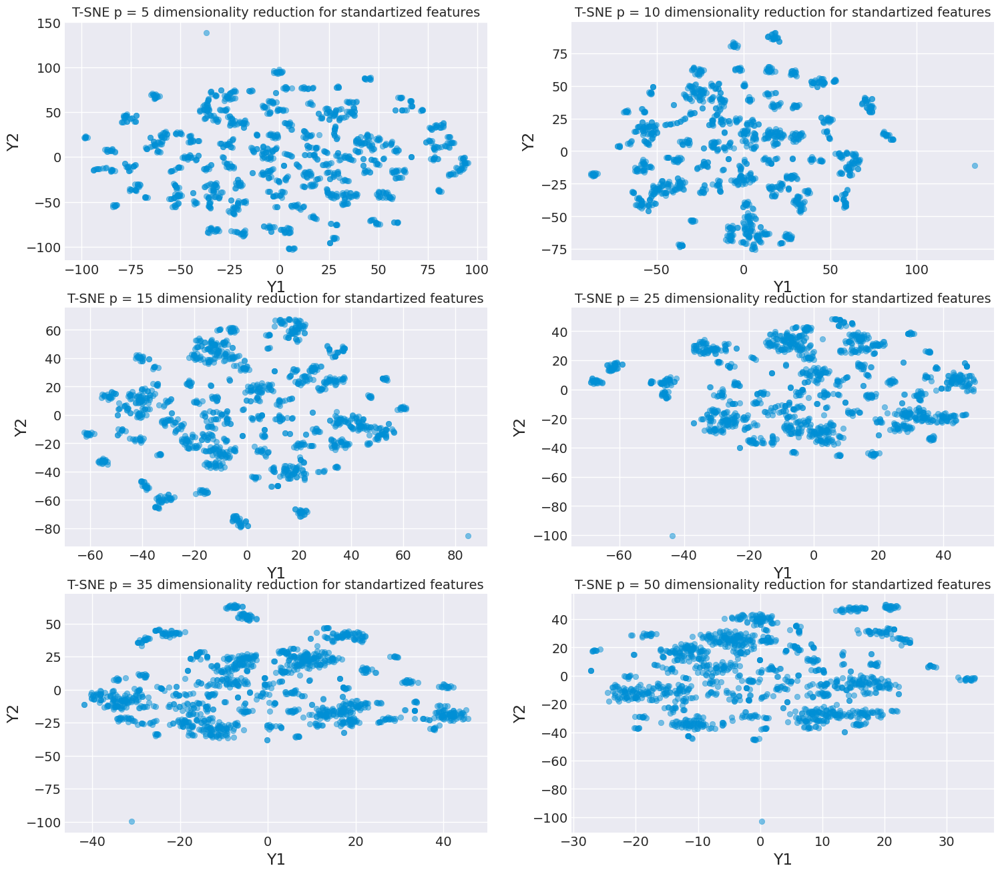

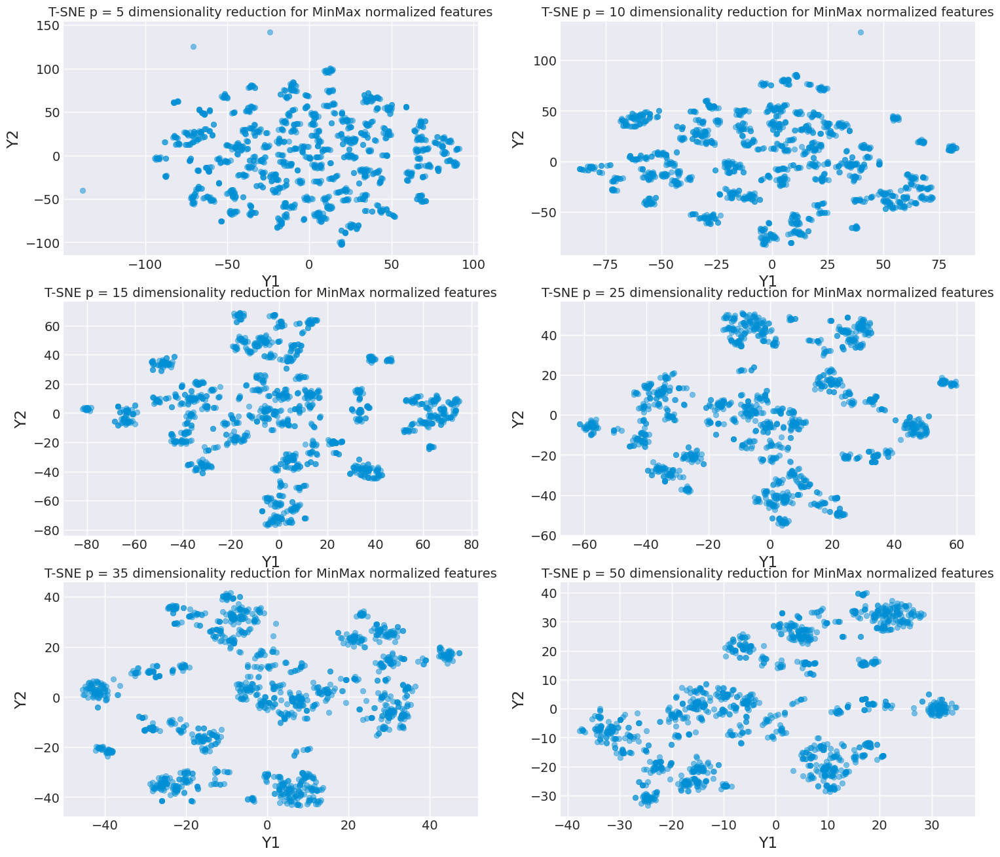

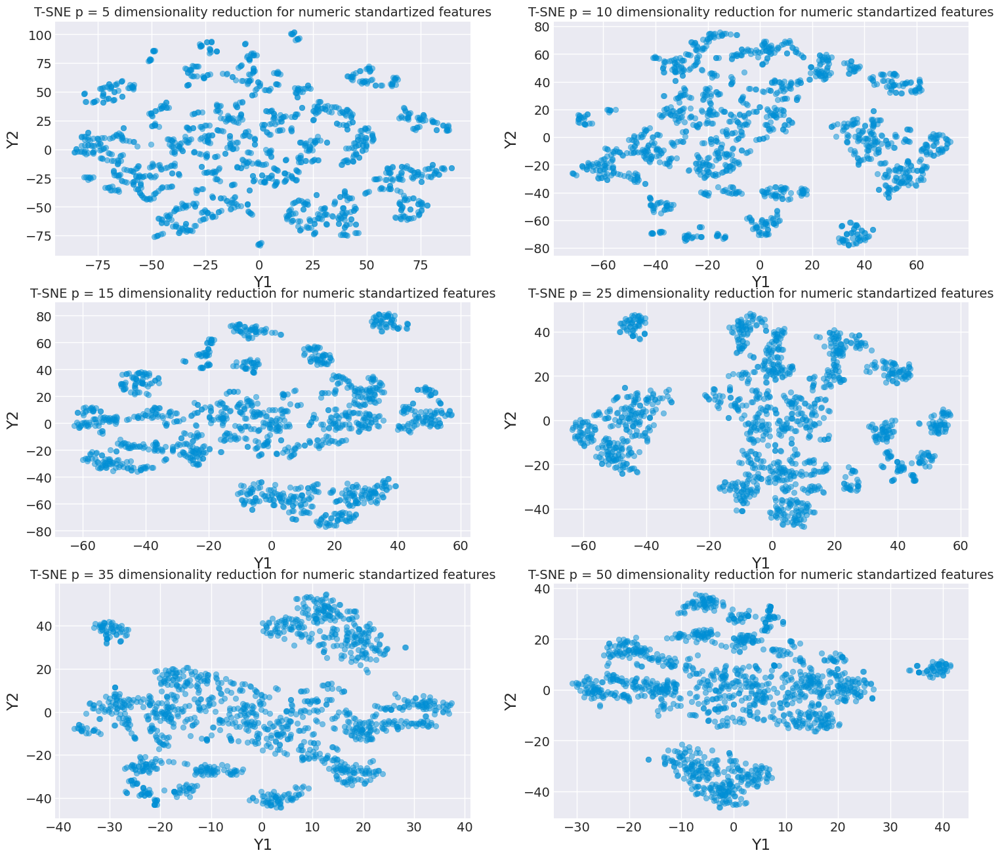

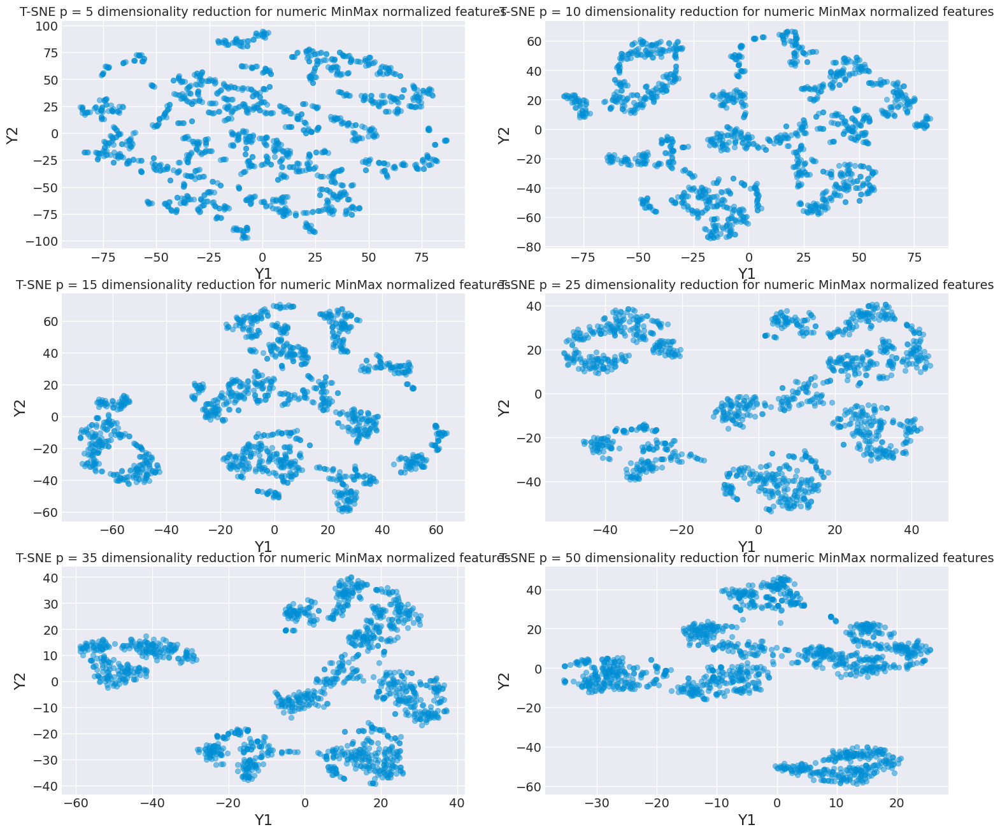

In [142]:
for k, title_add in zip(np.array(list(tsne_res.keys())), titles):
    low_dim_plot(np.array(list(tsne_res[k].values())), multi = True, method = 'T-SNE ', title_add = title_add, par_list = np.array(list(tsne_res[k].keys())))

Стандартизованные признаки очень плохо разделяются, данные очень зашумлены. Лучше всего визуально разделяются численные MinMax нормализованные признаки. В ячейке ниже видно, какие сочетания мы отобрали для дальнейшего рассмотрения.

In [143]:
X_tsne = tsne_res['X_mm']['p = 15']
X_num_tsne = tsne_res['X_num_mm']['p = 25']

Проделаем то же самое с UMAP.

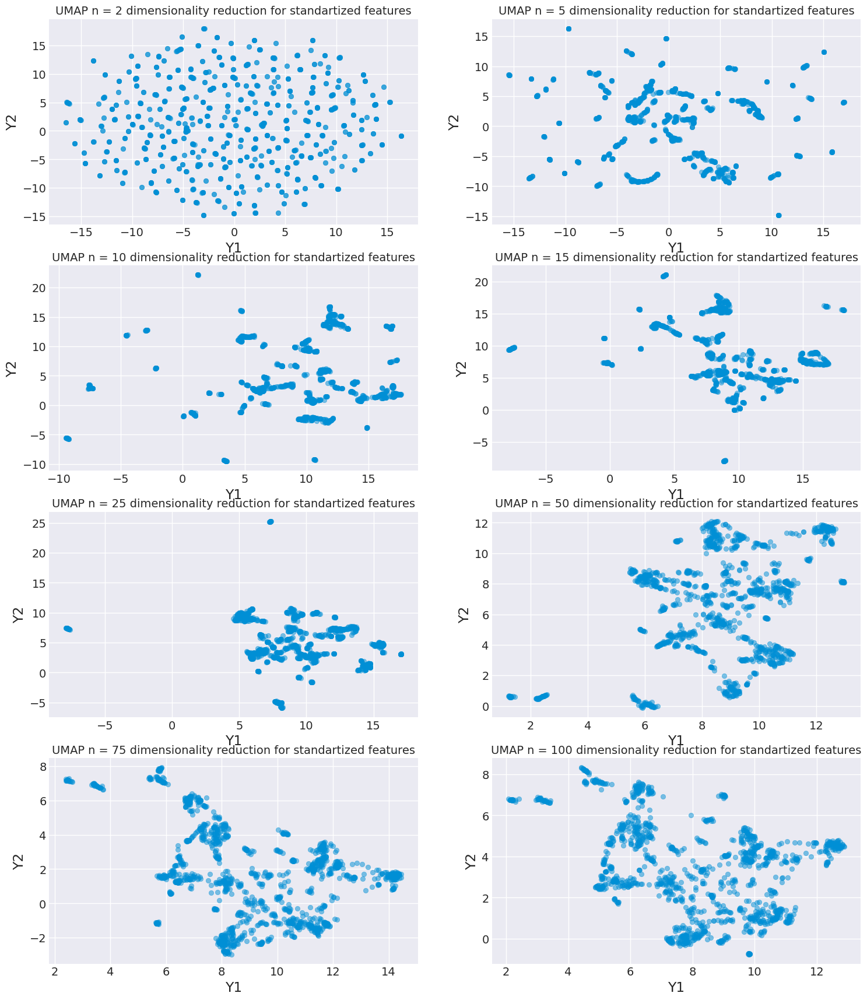

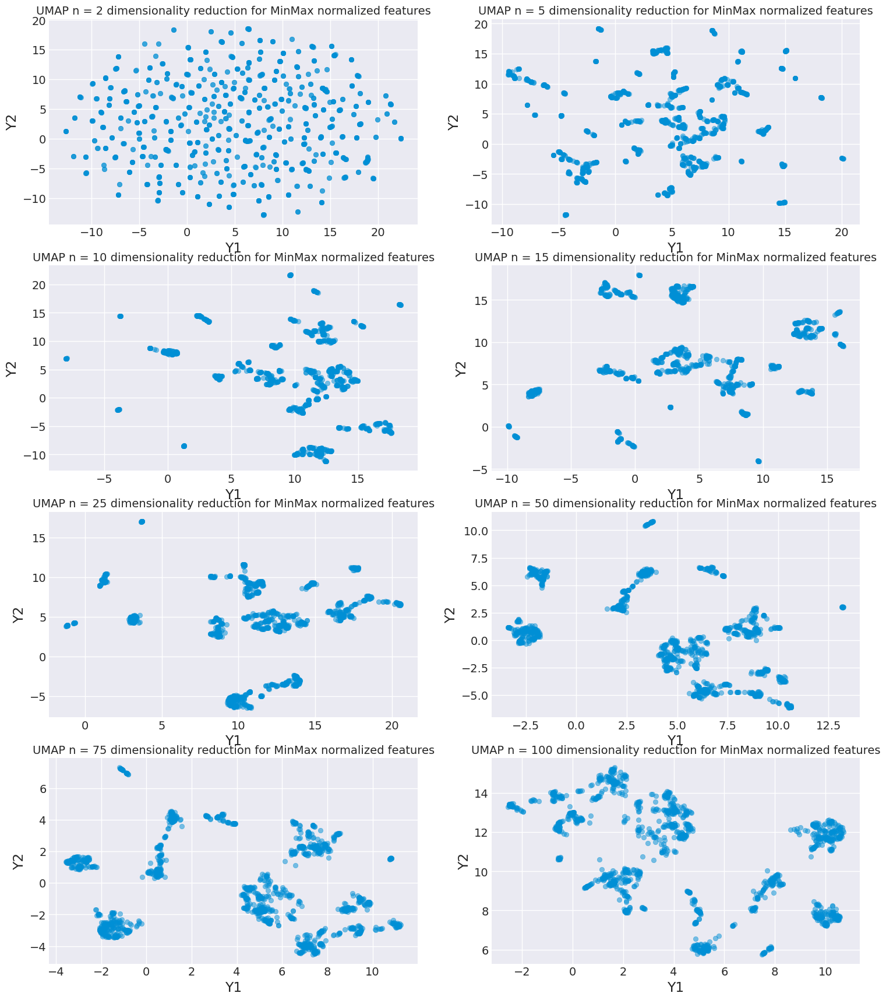

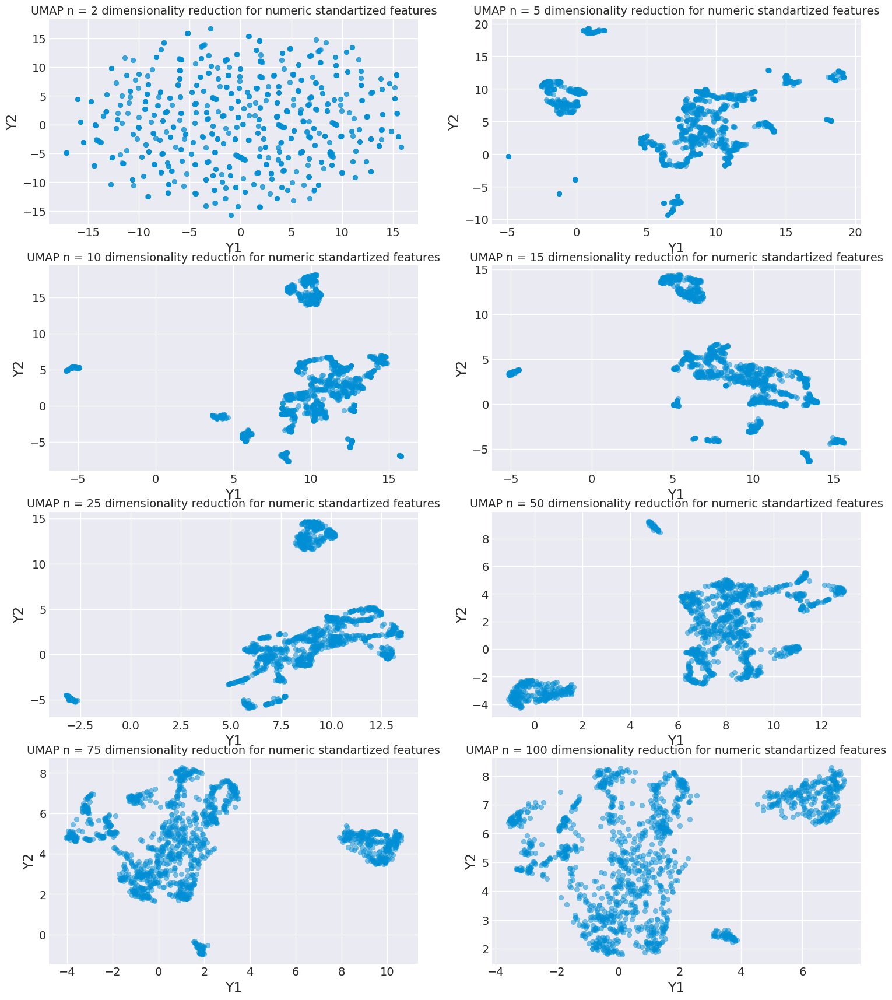

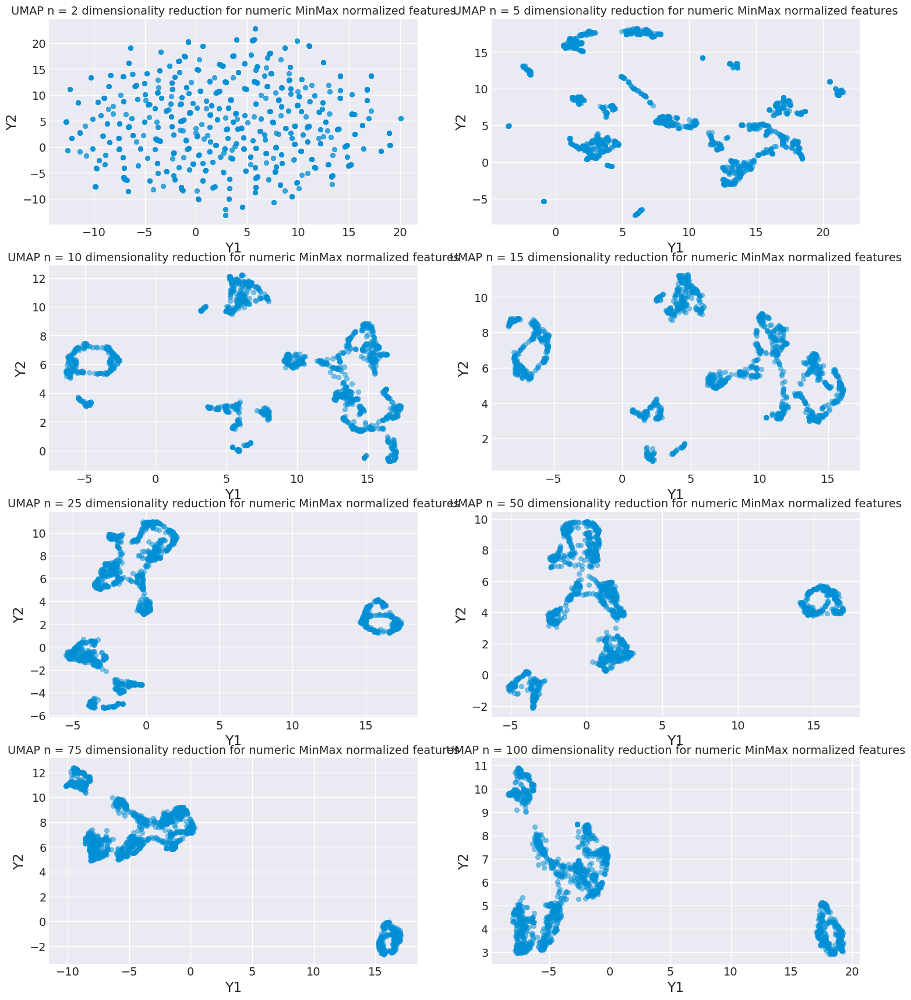

In [144]:
for k, title_add in zip(np.array(list(umap_res.keys())), titles):
    low_dim_plot(np.array(list(umap_res[k].values())), multi = True, method = 'UMAP ', title_add = title_add, par_list = np.array(list(umap_res[k].keys())))

Стандартизованные признаки по-прежнему очень плохо разделяются. Но в целом ситация гораздо лучше. Сравнительно четкие кластеры можно увидеть уже не только для численных признаков. Отберем 4 варианта.

In [145]:
X_umap = umap_res['X_mm']['n = 15']
X_num_umap = umap_res['X_num_mm']['n = 10']

Теперь попробуем повторно провести кластеризацию. Начнем с K-Means

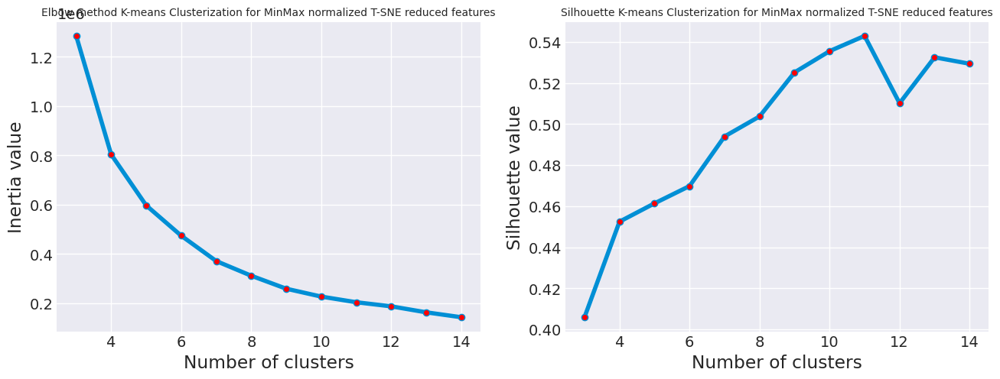

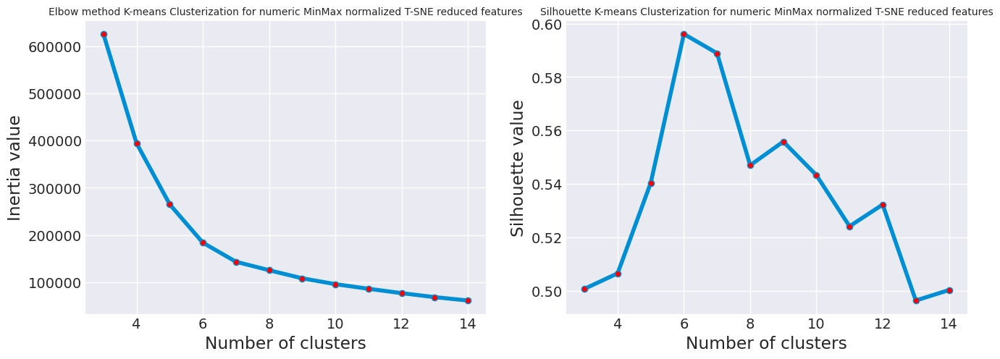

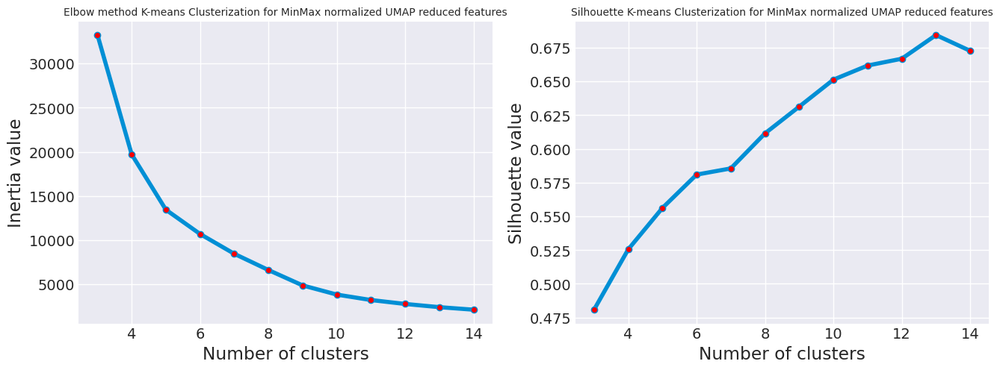

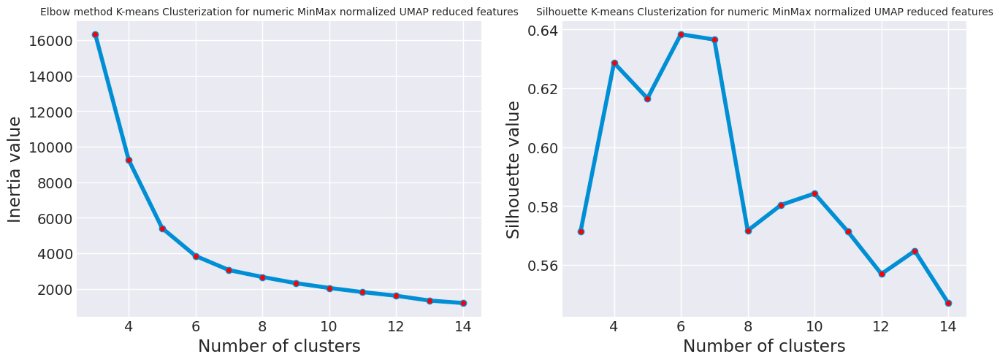

In [146]:
X_list_names_reduced = ['X_tsne', 'X_num_tsne', 'X_umap', 'X_num_umap']
titles_reduced = ['K-means Clusterization for MinMax normalized T-SNE reduced features',
         'K-means Clusterization for numeric MinMax normalized T-SNE reduced features', 'K-means Clusterization for MinMax normalized UMAP reduced features',
         'K-means Clusterization for numeric MinMax normalized UMAP reduced features']
X_list_reduced = [X_tsne, X_num_tsne, X_umap, X_num_umap]
Kmeansmodels_reduced = []
for X, title, name in zip(X_list_reduced, titles_reduced, X_list_names_reduced):
    models = Kmeansselect(X, range(3, 15))
    Kmeansmodels_reduced.append(models)
    models.plot_res(title, fontsize=10)

Видно, что значение силуэта выросло во всех случаях. По K-Means рационально отобрать 8, 7, 6 и 4 кластеров для соответствующих признаков.

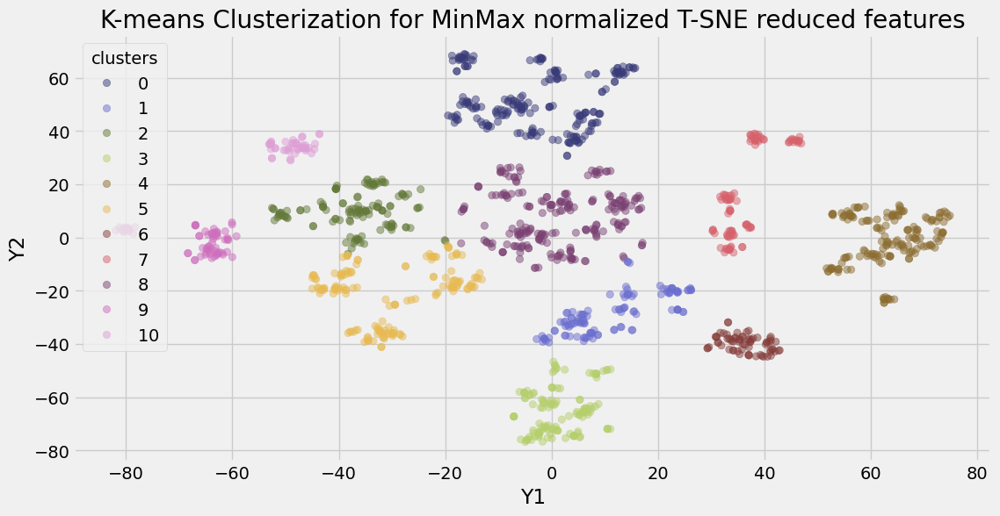

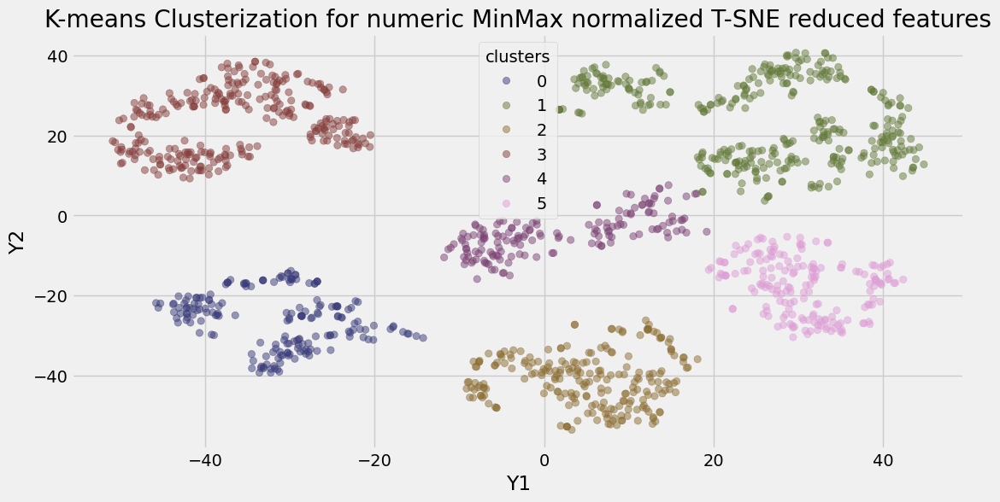

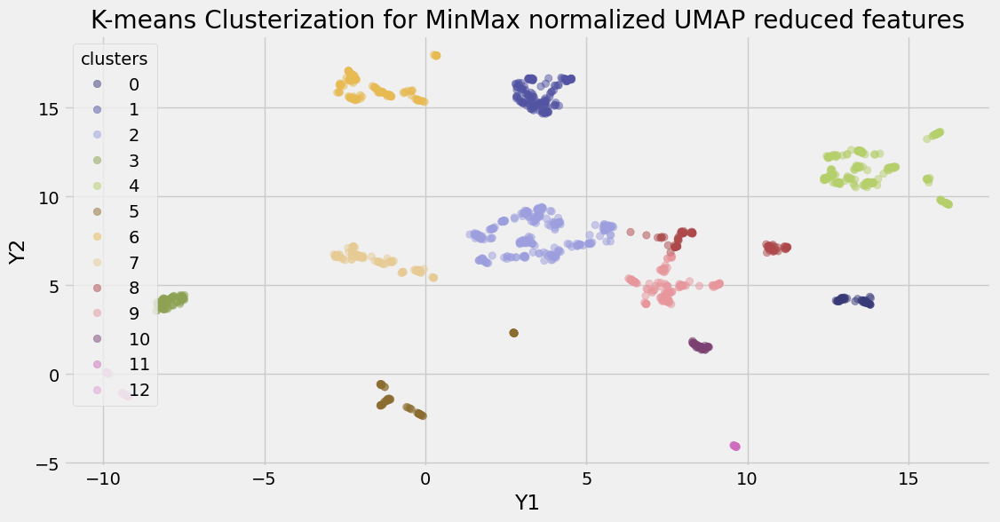

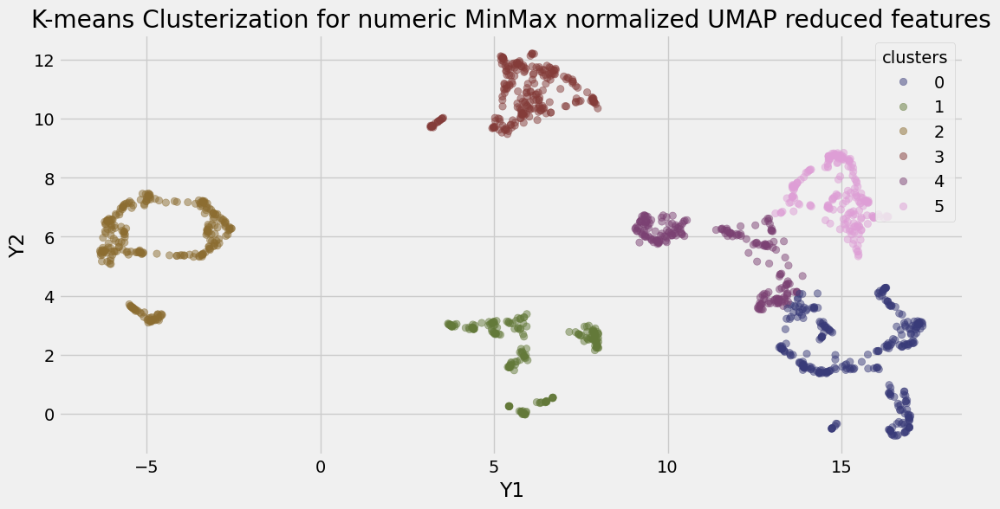

In [147]:
n_clusters = [11, 6, 13, 6]
for X, title_add, models, n in zip(X_list_reduced, titles_reduced, Kmeansmodels_reduced, n_clusters):
    n = n - 3
    hue = models.models[n].labels_
    low_dim_plot(X, title_add = title_add, hue = hue, clust = True)

## DBSCAN

Повторно переберем параметры DBSCANом

In [148]:
eps = [0.1, 0.25, 0.5, 1, 2]
min_samples = [ 5, 7, 10, 15, 25, 50, 100]

In [149]:
dbs_tables_reduced = [dbscan_search(eps, min_samples, X) for eps, min_samples, X in zip([eps]*len(X_list_reduced), [min_samples]*len(X_list_reduced), X_list_reduced)]
dbs_tables_reduced_dict = {k:v for k, v in zip(X_list_names_reduced, dbs_tables_reduced)}

In [150]:
dbmasks_reduced = [(table.iloc[0] < 250).values for table in dbs_tables_reduced_dict.values()]
dbs_tables_reduced_real = [table.loc[:, dbmask].dropna(axis = 0, how = 'all') for table, dbmask in zip(dbs_tables_reduced, dbmasks_reduced)]
dbs_tables_reduced_dict_real = {k:v.loc[:, dbmask].dropna(axis = 0, how = 'all') for k, v, dbmask in zip(X_list_names_reduced, dbs_tables_reduced_dict.values(), dbmasks_reduced)}

In [151]:
from IPython.display import display
for df in dbs_tables_reduced_real:
    display(df)

,e = 2 msp = 5
-1,170.0
0,20.0
1,8.0
2,30.0
3,25.0
...,...
82,9.0
83,5.0
84,6.0
85,5.0


,e = 2 msp = 5,e = 2 msp = 7
-1,75.0,175.0
0,47.0,46.0
1,119.0,45.0
2,74.0,62.0
3,49.0,47.0
4,90.0,86.0
5,6.0,64.0
6,153.0,15.0
7,14.0,69.0
8,116.0,46.0


,e = 0.1 msp = 5,e = 0.25 msp = 5,e = 0.25 msp = 7,e = 0.25 msp = 10,e = 0.5 msp = 5,e = 0.5 msp = 7,e = 0.5 msp = 10,e = 0.5 msp = 15,e = 1 msp = 10,e = 1 msp = 15,e = 1 msp = 25,e = 2 msp = 15,e = 2 msp = 25,e = 2 msp = 50
-1,234,33.0,70.0,147.0,1.0,1.0,11.0,63.0,9.0,46.0,105.0,24.0,40.0,179.0
0,19,22.0,22.0,22.0,71.0,71.0,71.0,71.0,125.0,125.0,125.0,125.0,125.0,125.0
1,8,98.0,89.0,32.0,104.0,104.0,104.0,90.0,150.0,150.0,150.0,209.0,209.0,186.0
2,10,32.0,32.0,74.0,143.0,143.0,143.0,143.0,143.0,143.0,143.0,143.0,143.0,143.0
3,17,19.0,12.0,12.0,146.0,146.0,146.0,130.0,465.0,465.0,465.0,578.0,578.0,578.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
84,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
85,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
86,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,e = 0.25 msp = 5,e = 0.25 msp = 7,e = 0.25 msp = 10,e = 0.5 msp = 10,e = 0.5 msp = 15,e = 1 msp = 10,e = 1 msp = 15,e = 1 msp = 25,e = 1 msp = 50,e = 2 msp = 100
-1,46.0,83.0,204.0,9.0,11.0,8.0,8.0,30.0,111.0,43.0
0,50.0,50.0,49.0,50.0,50.0,50.0,50.0,50.0,50.0,699.0
1,103.0,62.0,23.0,247.0,160.0,691.0,691.0,691.0,192.0,246.0
2,87.0,86.0,44.0,118.0,118.0,227.0,227.0,227.0,198.0,234.0
3,45.0,45.0,42.0,81.0,80.0,212.0,212.0,212.0,96.0,172.0
4,53.0,53.0,61.0,101.0,100.0,46.0,46.0,46.0,212.0,NaN
5,99.0,92.0,15.0,91.0,91.0,103.0,103.0,103.0,127.0,NaN
6,7.0,7.0,29.0,212.0,32.0,35.0,35.0,35.0,100.0,NaN
7,88.0,86.0,44.0,126.0,193.0,22.0,22.0,NaN,93.0,NaN
8,85.0,85.0,46.0,46.0,126.0,NaN,NaN,NaN,103.0,NaN


В случае с T-SNE все разделяется не очень, слишком много кластеров.

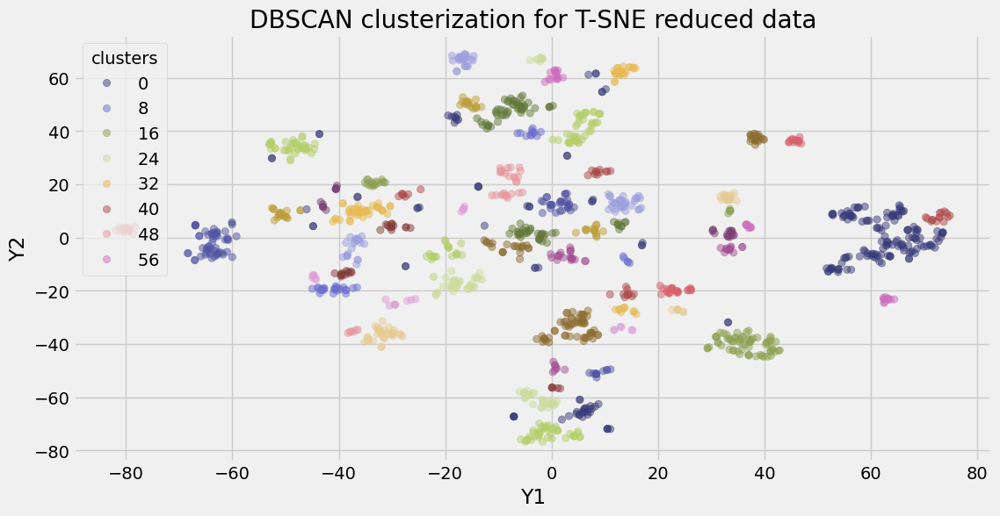

In [152]:
X_tsne_db = DBSCAN(eps = 3, min_samples=5)
X_tsne_db_labels = X_tsne_db.fit_predict(X_tsne)
low_dim_plot(X_tsne, clust = True, title_add = 'DBSCAN clusterization for T-SNE reduced data', hue = X_tsne_db_labels)

T-SNE только для числовых признаков уже работает лучше, отделяются мелкие группы точек

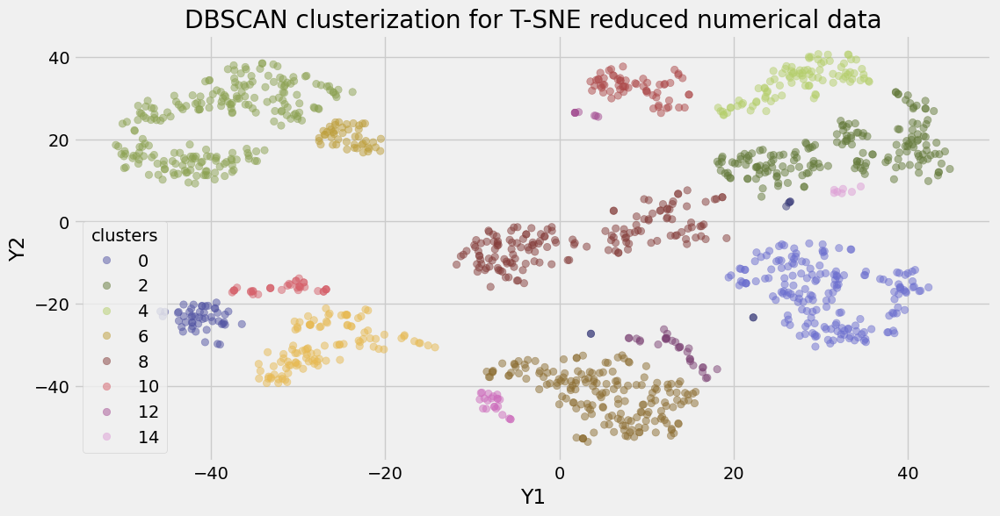

In [153]:
X_num_tsne_db = DBSCAN(eps = 3, min_samples=5)
X_num_tsne_db_labels = X_tsne_db.fit_predict(X_num_tsne)
low_dim_plot(X_num_tsne, clust = True, title_add = 'DBSCAN clusterization for T-SNE reduced numerical data', hue = X_num_tsne_db_labels)

Для данных, обработанных UMAP кластеры хорошо заметны и четко разделяются. Кроме того, большинство расположены на заметном расстоянии друг от друга

In [154]:
X_umap_db = DBSCAN(eps = 0.9, min_samples=10)
X_umap_db_labels = X_umap_db.fit_predict(X_umap)

In [155]:
test_umap = pd.DataFrame(X_umap, columns = ['one', 'two'])
test_umap['label'] = X_umap_db_labels
test_umap.drop(test_umap[test_umap['label'] == -1].index, inplace = True)

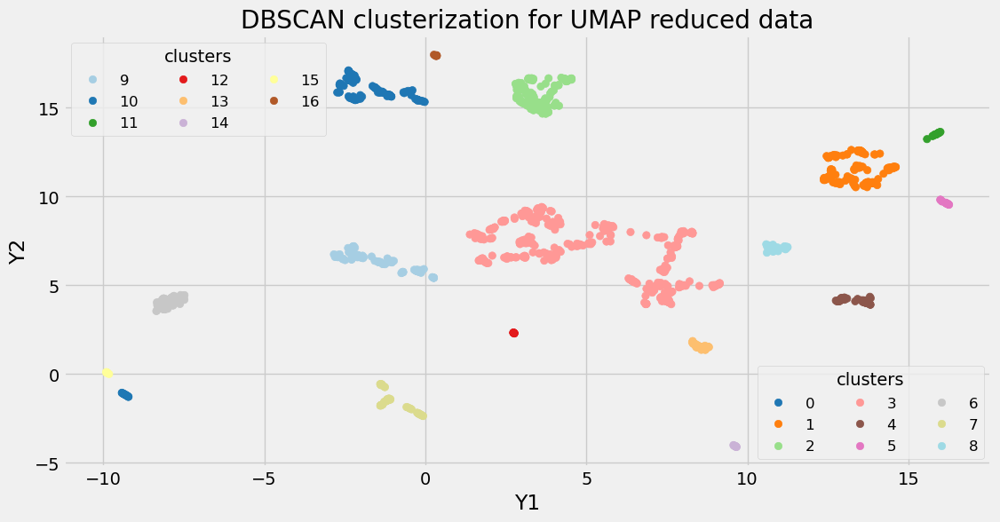

In [156]:
fig, ax = plt.subplots(figsize = (12,6))
ax.set_title('DBSCAN clusterization for UMAP reduced data')
ax.set_ylabel('Y2')
ax.set_xlabel('Y1')
plot1 = ax.scatter(test_umap[test_umap['label'].isin([ 0,  1,  2,  3,  4,  5,  6,  7,  8])]['one'], test_umap[test_umap['label'].isin([ 0,  1,  2,  3,  4,  5,  6,  7,  8])]['two'], c=test_umap[test_umap['label'].isin([ 0,  1,  2,  3,  4,  5,  6,  7,  8])]['label'], cmap = 'tab20', alpha=1)
plot2 = ax.scatter(test_umap[test_umap['label'].isin([9, 10, 11, 12, 13, 14, 15, 16])]['one'], test_umap[test_umap['label'].isin([ 9, 10, 11, 12, 13, 14, 15, 16])]['two'], c=test_umap[test_umap['label'].isin([ 9, 10, 11, 12, 13, 14, 15, 16])]['label'], cmap = 'Paired', alpha=1)
leg1 = ax.legend(*plot1.legend_elements(), title='clusters', loc = 'lower right', ncol = 3, fontsize = 12)
leg2 = ax.legend(*plot2.legend_elements(), title='clusters', ncol = 3, fontsize = 12)
ax.add_artist(leg1)

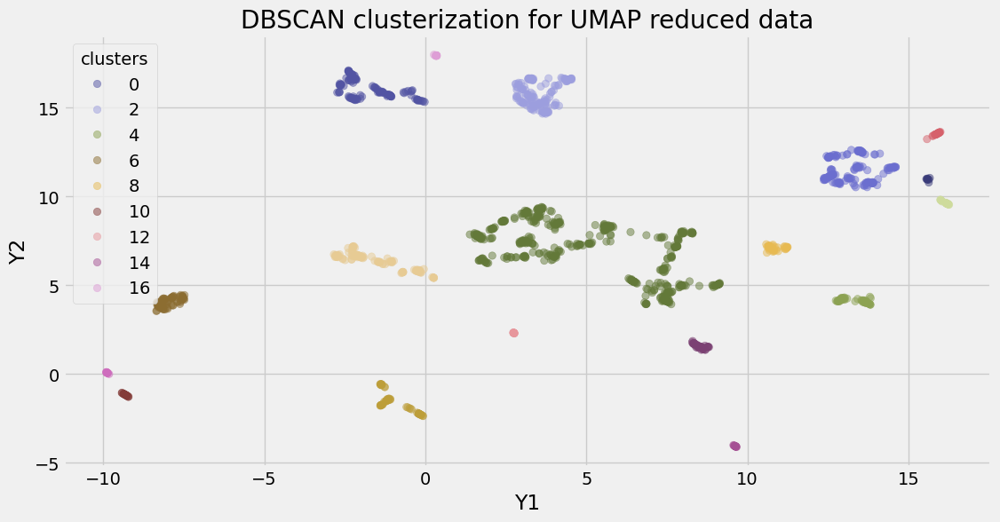

In [157]:
low_dim_plot(X_umap, clust = True, title_add = 'DBSCAN clusterization for UMAP reduced data', hue = X_umap_db_labels)

Только числовые признаки хуже разделились UMAPом и соответственно хуже кластеризовались.

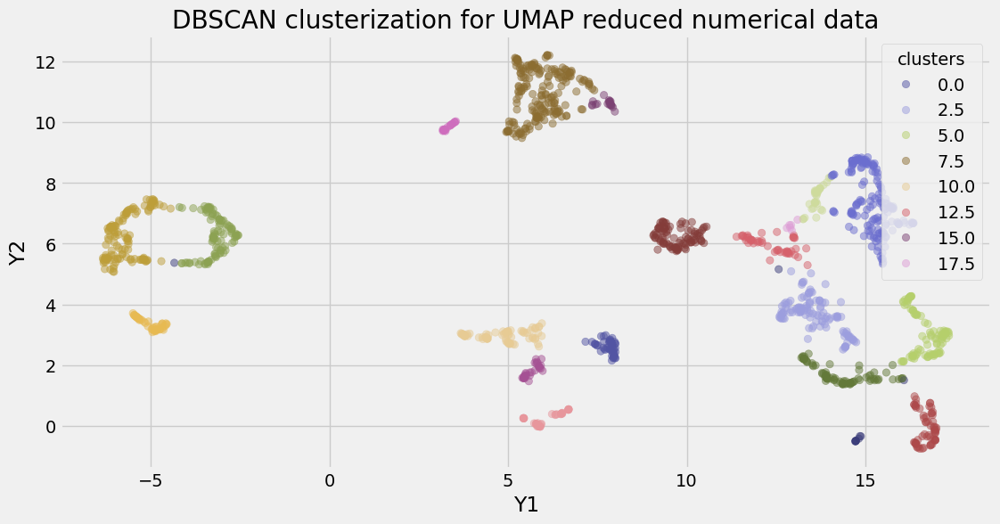

In [158]:
X_num_umap_db = DBSCAN(eps = 0.5, min_samples=15)
X_num_umap_db_labels = X_num_umap_db.fit_predict(X_num_umap)
low_dim_plot(X_num_umap, clust = True, title_add = 'DBSCAN clusterization for UMAP reduced numerical data', hue = X_num_umap_db_labels)

In [159]:
df_clustered_db = df_cla.copy()
df_clustered_db['cluster'] = X_umap_db_labels
df_clustered_db.drop(df_clustered_db[df_clustered_db['cluster'] == -1].index, inplace = True)

<AxesSubplot:title={'center':'Clusters size'}>

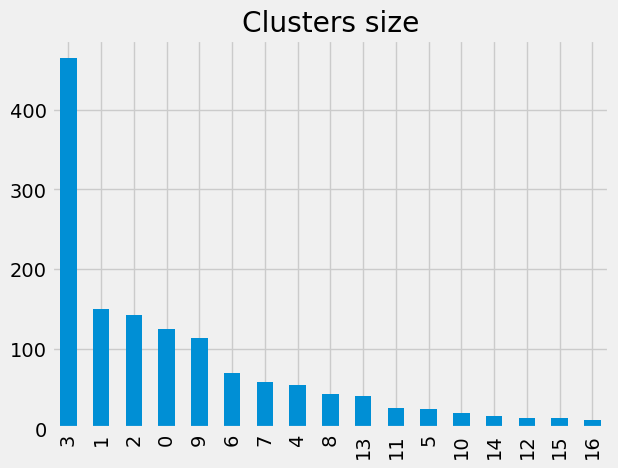

In [160]:
df_clustered_db['cluster'].value_counts().plot.bar(title = 'Clusters size')

Для начала рассмотрим крупные кластеры. Между ними должны быть значимые различия

In [161]:
big_clusters = df_clustered_db[df_clustered_db['cluster'].isin([3, 1, 2, 0,  9])]
# big_clusters.drop('SalePrice', inplace=True, axis = 1)

In [162]:
gbbig = big_clusters.groupby('cluster').mean()
gbbig

,SalePrice,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,TotalBsmtSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageArea,Fence
cluster,,,,,,,,,,,,,,
0,189937.712000,9812.056000,6.520000,5.064000,1998.328000,2001.392000,1133.552000,1474.792000,2.944000,1.008000,6.472000,0.072000,531.704000,0.096000
1,138531.926667,8844.973333,5.200000,5.986667,1946.886667,1971.866667,896.166667,1353.073333,2.866667,1.086667,6.286667,0.460000,375.853333,0.280000
2,244873.377622,10386.370629,7.384615,5.069930,2002.356643,2003.209790,1215.244755,1836.797203,2.965035,1.000000,7.314685,1.048951,612.006993,0.000000
3,155103.098925,10317.346237,5.649462,5.759140,1953.191398,1974.800000,1007.501075,1441.722581,2.877419,1.058065,6.320430,0.683871,414.840860,0.283871
9,136908.035398,8196.884956,5.327434,5.973451,1961.584071,1982.982301,895.371681,1229.353982,2.557522,1.079646,5.699115,0.318584,381.566372,0.221239


<AxesSubplot:title={'center':'Area values in clusters'}, xlabel='cluster'>

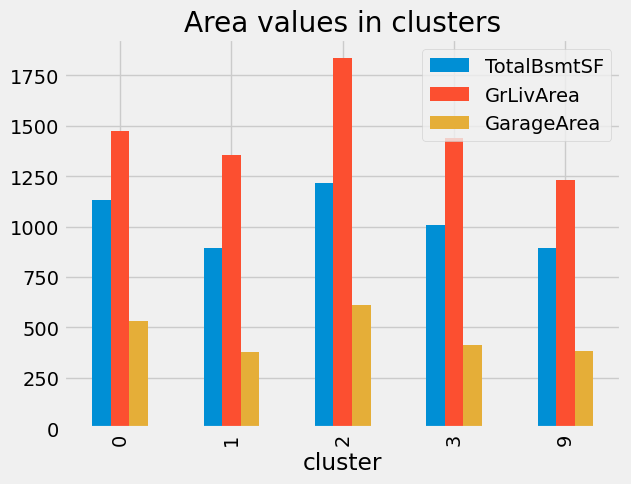

In [182]:
gbbig[['TotalBsmtSF', 'GrLivArea', 'GarageArea']].plot.bar(title = 'Area values in clusters')

In [164]:
for col in cat_cols:
    print(big_clusters[big_clusters['cluster'] == 3][col].value_counts())
    print('\n')

RL         379
RM          78
C (all)      4
RH           4
Name: MSZoning, dtype: int64


AllPub    465
Name: Utilities, dtype: int64


Norm      385
Feedr      38
Artery     20
PosN        7
RRAn        6
PosA        6
RRNn        2
RRAe        1
Name: Condition1, dtype: int64


Norm     459
Feedr      4
PosA       1
RRAe       1
Name: Condition2, dtype: int64


Gable      316
Hip        129
Flat        11
Gambrel      5
Mansard      2
Shed         2
Name: RoofStyle, dtype: int64


CompShg    447
Tar&Grv     10
WdShake      4
WdShngl      2
Metal        1
Roll         1
Name: RoofMatl, dtype: int64


Wd Sdng    191
Plywood     97
HdBoard     69
BrkFace     40
WdShing     23
Stucco      21
AsbShng     17
BrkComm      2
VinylSd      1
CemntBd      1
MetalSd      1
Stone        1
ImStucc      1
Name: Exterior1st, dtype: int64


Wd Sdng    180
Plywood    129
HdBoard     51
Wd Shng     29
Stucco      22
BrkFace     20
AsbShng     17
Brk Cmn      7
ImStucc      6
Stone        2
MetalSd    

В 3й кластер вошли дома среднего размера и среднего качества. Дома довольно старые, большая часть построена в 1950-е годы. При этом площадь этих участков сравнительно высока, тогда как жилая площадь меньше чем в других кластерах. Эти дома расположены преимущественно в жилых районах высокой плотности. Во всех домах есть основные удобства, большинство домов расположены вдалеке от больших дорог и культурных объектов. Многие дома имеют деревянную отделку, большинство среднего или хорошего качества, крыши двускатные или вальмовые, шиферные. Высота и качество подвалов среднее, отопление газовое, среднего качества. Примерно в половине домов кластера есть камины, половина из них хорошего качества. Гаражи также есть в большинстве домов, среднего качества и состояния.

В целом 3й кластер представлен довольно старыми домами с не самым лучшим местом расположения но всеми удобствами и в удовлетворительном состоянии.

In [165]:
for col in cat_cols:
    print(big_clusters[big_clusters['cluster'] == 1][col].value_counts())
    print('\n')

RL         99
RM         44
C (all)     5
RH          2
Name: MSZoning, dtype: int64


AllPub    150
Name: Utilities, dtype: int64


Norm      114
Artery     18
Feedr      13
RRAe        2
RRAn        2
PosN        1
Name: Condition1, dtype: int64


Norm      147
RRNn        2
Artery      1
Name: Condition2, dtype: int64


Gable      144
Gambrel      3
Hip          2
Mansard      1
Name: RoofStyle, dtype: int64


CompShg    150
Name: RoofMatl, dtype: int64


MetalSd    149
CBlock       1
Name: Exterior1st, dtype: int64


MetalSd    145
AsphShn      1
Wd Sdng      1
HdBoard      1
Wd Shng      1
CBlock       1
Name: Exterior2nd, dtype: int64


TA    135
Gd     12
Fa      3
Name: ExterQual, dtype: int64


TA    116
Gd     30
Fa      3
Ex      1
Name: ExterCond, dtype: int64


CBlock    92
BrkTil    35
PConc     20
Slab       1
Stone      1
Wood       1
Name: Foundation, dtype: int64


TA    115
Gd     21
Fa     10
No      2
Ex      2
Name: BsmtQual, dtype: int64


TA    137
Fa      7
Gd 

Дома из 1 кластера имеют меньшую площадь участка и жилую площадь, а также меньшую площадь пристроек (гаража, подвала). Меньшие показатели площади среди крупных кластеров только у домов из кластера 9.  
Дома как и в кластере 3 располагаются в районах высокой и средней плотности. Дома еще старее, чем в кластере 3, большая часть построена в 40-е годы. В домах есть все удобства. Крыши у домов двускатные, шиферные. Отделка дома стальная, среднего качества. Подвалы среднего качества. Отопление газовое, у большей части домов отличное или хорошее. Качество кухни и гаража среднее, камины есть в половине домов, хорошего или нормального качества.

В этом кластере небольшие, довольно старые дома среднего качества

In [166]:
for col in cat_cols:
    print(big_clusters[big_clusters['cluster'] == 2][col].value_counts())
    print('\n')

RL    143
Name: MSZoning, dtype: int64


AllPub    143
Name: Utilities, dtype: int64


Norm    142
PosN      1
Name: Condition1, dtype: int64


Norm    143
Name: Condition2, dtype: int64


Gable    143
Name: RoofStyle, dtype: int64


CompShg    143
Name: RoofMatl, dtype: int64


VinylSd    142
Stone        1
Name: Exterior1st, dtype: int64


VinylSd    141
Other        1
Stone        1
Name: Exterior2nd, dtype: int64


Gd    131
TA      7
Ex      5
Name: ExterQual, dtype: int64


TA    141
Gd      2
Name: ExterCond, dtype: int64


PConc    143
Name: Foundation, dtype: int64


Gd    114
Ex     27
TA      2
Name: BsmtQual, dtype: int64


TA    132
Gd     11
Name: BsmtCond, dtype: int64


GasA    143
Name: Heating, dtype: int64


Ex    137
Gd      6
Name: HeatingQC, dtype: int64


Gd    125
Ex     17
TA      1
Name: KitchenQual, dtype: int64


Gd    85
TA    52
Ex     4
Fa     2
Name: FireplaceQu, dtype: int64


TA    142
Gd      1
Name: GarageQual, dtype: int64


TA    143
Name: GarageCo

Кластер 2 визуально плотнее предыдущих рассмотренных. Среди крупных кластеров площадь домов во 2м кластере наибольшая, как и жилая площадь и площадь хозяйственных построек. Дома сравнительно новые, 2000-х годов постройки. Эти дома получили оценку качества 7.3, выше всех остальных кластеров. В домах в среднем более 7 комнат, больше, чем в других кластерах. Дома расположены в жилых районах низкой плотности, вероятно за городом, вдалеке от больших дорог. В домах есть все удобства. Крыши двускатные, черепичные. Внешняя отделка виниловая, хорошего качества, состояние среднее. Подвалы хорошего качества, среднего состояния. Отопление газовое, отличного качества. Качество кухни хорошее, камины есть в 2/3 домов, хорошего или среднего качества.

В кластере 2 представлены элитные, качественные большие дома

In [167]:
for col in cat_cols:
    print(big_clusters[big_clusters['cluster'] == 0][col].value_counts())
    print('\n')

RL    124
RH      1
Name: MSZoning, dtype: int64


AllPub    125
Name: Utilities, dtype: int64


Norm     112
Feedr      8
RRAe       4
RRNn       1
Name: Condition1, dtype: int64


Norm    125
Name: Condition2, dtype: int64


Gable      124
Gambrel      1
Name: RoofStyle, dtype: int64


CompShg    125
Name: RoofMatl, dtype: int64


VinylSd    124
Wd Sdng      1
Name: Exterior1st, dtype: int64


VinylSd    121
Wd Shng      4
Name: Exterior2nd, dtype: int64


Gd    78
TA    47
Name: ExterQual, dtype: int64


TA    115
Gd      8
Fa      2
Name: ExterCond, dtype: int64


PConc     123
Wood        1
BrkTil      1
Name: Foundation, dtype: int64


Gd    109
TA      9
Ex      7
Name: BsmtQual, dtype: int64


TA    118
Gd      5
Fa      2
Name: BsmtCond, dtype: int64


GasA    125
Name: Heating, dtype: int64


Ex    106
Gd     14
TA      5
Name: HeatingQC, dtype: int64


Gd    95
TA    26
Ex     3
Fa     1
Name: KitchenQual, dtype: int64


No    117
TA      4
Gd      4
Name: FireplaceQu, dtype

Кластер 0 отличается от кластеров 3 и 1 тем, что дома построены в конце 90х-2000х годах, отличаются немного более высокими оценками качества и большими гаражами. Дома также расположены в районах низкой плотности, в них есть все удобства. Крыши двускатные, черепичные, отделка виниловая, хорошего или среднего качества и состояния, отопление газовое, отличного качества. Подвалы хорошего качества, состояние среднее. Гаражи среднего качества, каминов в основном нет.

В целом дома по качеству лишь немного уступают домам 2го кластера и заметно уступают по площади. Дома качественные, элитые, но небольшие

In [168]:
for col in cat_cols:
    print(big_clusters[big_clusters['cluster'] == 9][col].value_counts())
    print('\n')

RL    63
RM    48
RH     2
Name: MSZoning, dtype: int64


AllPub    113
Name: Utilities, dtype: int64


Norm      94
Feedr     10
Artery     5
PosN       2
RRAn       2
Name: Condition1, dtype: int64


Norm     111
Feedr      1
RRAn       1
Name: Condition2, dtype: int64


Gable      93
Hip        17
Gambrel     2
Mansard     1
Name: RoofStyle, dtype: int64


CompShg    113
Name: RoofMatl, dtype: int64


VinylSd    113
Name: Exterior1st, dtype: int64


VinylSd    108
Stucco       1
Wd Shng      1
Plywood      1
Wd Sdng      1
AsbShng      1
Name: Exterior2nd, dtype: int64


TA    87
Gd    24
Fa     2
Name: ExterQual, dtype: int64


TA    87
Gd    23
Fa     2
Ex     1
Name: ExterCond, dtype: int64


CBlock    71
PConc     30
BrkTil    11
Slab       1
Name: Foundation, dtype: int64


TA    70
Gd    32
Fa     4
Ex     4
No     3
Name: BsmtQual, dtype: int64


TA    102
Fa      5
Gd      3
No      3
Name: BsmtCond, dtype: int64


GasA     111
Grav       1
Floor      1
Name: Heating, dtype:

В кластере 9 находятся самые маленькие дома, как по жилой, так и по общей площади. Дома довольно старые, 60-х годов постройки. Расположены в районах низкой и средней плотности, имеют все удобства. Крыши двускатные, черепичные, отделка виниловая, среднего качества. Подвалы среднего качества и состояния. Отопление газовое, качество отличное или хорошее. В большинстве домов нет камина, кухни среднего качества. Гаражи среднего качества.

В целом этот кластер представляет собой кластер маленьких домов среднего качества, но с неплохим качеством отделки.

Большие кластеры рассмотрены, посмотрим, какие небольшие группы наблюдений располагаются недалеко от крупных кластеров и почему они отделились.

In [169]:
clusters_1_11_5 = df_clustered_db[df_clustered_db['cluster'].isin([1, 11, 5])]
gb1_11_5 = clusters_1_11_5.groupby('cluster').mean()
gb1_11_5

,SalePrice,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,TotalBsmtSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageArea,Fence
cluster,,,,,,,,,,,,,,
1,138531.926667,8844.973333,5.200000,5.986667,1946.886667,1971.866667,896.166667,1353.073333,2.866667,1.086667,6.286667,0.460000,375.853333,0.28
5,137274.291667,9551.375000,5.166667,6.125000,1960.291667,1969.166667,988.625000,1079.916667,2.500000,1.000000,5.500000,0.250000,432.208333,0.25
11,174159.692308,3489.269231,6.884615,5.038462,1998.115385,1999.923077,844.269231,1386.153846,2.307692,1.000000,5.076923,0.230769,463.653846,0.00


In [ ]:
gb1_11_5[['LotArea', 'TotalBsmtSF', 'GrLivArea', 'GarageArea']].plot.bar(title = 'Area values in clusters')

In [171]:
for col in cat_cols:
    print(clusters_1_11_5[clusters_1_11_5['cluster'] == 1][col].value_counts())
    print(clusters_1_11_5[clusters_1_11_5['cluster'] == 11][col].value_counts())
    print(clusters_1_11_5[clusters_1_11_5['cluster'] == 5][col].value_counts())
    print('\n')

RL         99
RM         44
C (all)     5
RH          2
Name: MSZoning, dtype: int64
FV    23
RH     3
Name: MSZoning, dtype: int64
RL    24
Name: MSZoning, dtype: int64


AllPub    150
Name: Utilities, dtype: int64
AllPub    26
Name: Utilities, dtype: int64
AllPub    24
Name: Utilities, dtype: int64


Norm      114
Artery     18
Feedr      13
RRAe        2
RRAn        2
PosN        1
Name: Condition1, dtype: int64
Norm    26
Name: Condition1, dtype: int64
Norm     21
Feedr     2
PosN      1
Name: Condition1, dtype: int64


Norm      147
RRNn        2
Artery      1
Name: Condition2, dtype: int64
Norm    26
Name: Condition2, dtype: int64
Norm    24
Name: Condition2, dtype: int64


Gable      144
Gambrel      3
Hip          2
Mansard      1
Name: RoofStyle, dtype: int64
Gable    24
Hip       2
Name: RoofStyle, dtype: int64
Hip    24
Name: RoofStyle, dtype: int64


CompShg    150
Name: RoofMatl, dtype: int64
CompShg    26
Name: RoofMatl, dtype: int64
CompShg    24
Name: RoofMatl, dtype: i

Дома из кластера 1 небольшие, а в 11 кластере у домов очень маленькие участки, но сами дома сравинительно новые. Кластеры практически не отличаются отделкой, ее качеством и пристройками. Кластер 5 очень похож на кластер 1, но оценка у домов в этом кластере выше и дома немного новее.

In [172]:
clusters6_15_10 = df_clustered_db[df_clustered_db['cluster'].isin([6, 15, 10])]
gb6_15_10 = clusters6_15_10.groupby('cluster').mean()
gb6_15_10

,SalePrice,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,TotalBsmtSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageArea,Fence
cluster,,,,,,,,,,,,,,
6,310779.657143,11549.642857,8.100000,5.028571,2003.657143,2004.400000,1595.457143,1986.957143,2.928571,1.0,8.014286,1.057143,722.542857,0.000000
10,209232.789474,7595.894737,6.947368,5.052632,2006.473684,2006.684211,986.789474,1500.421053,2.578947,1.0,5.947368,0.000000,605.578947,0.000000
15,249198.307692,9220.615385,7.615385,5.000000,2005.538462,2005.923077,1120.538462,1782.000000,2.923077,1.0,7.384615,1.000000,740.230769,0.076923


<AxesSubplot:title={'center':'Area values in clusters'}, xlabel='cluster'>

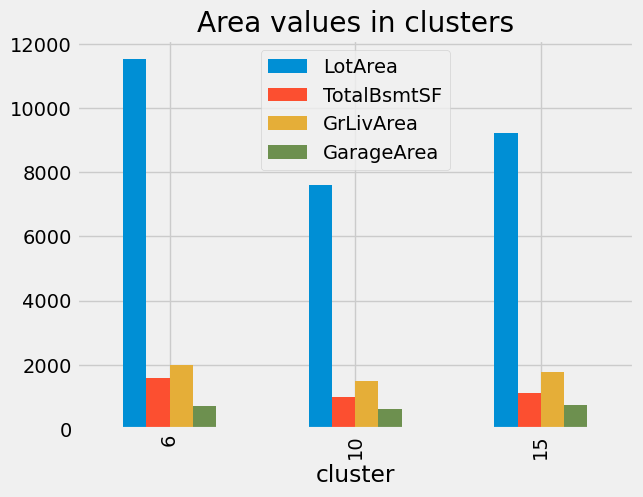

In [181]:
gb6_15_10[['LotArea', 'TotalBsmtSF', 'GrLivArea', 'GarageArea']].plot.bar(title = 'Area values in clusters')

In [174]:
for col in cat_cols:
    print(clusters6_15_10[clusters6_15_10['cluster'] == 6][col].value_counts())
    print(clusters6_15_10[clusters6_15_10['cluster'] == 15][col].value_counts())
    print(clusters6_15_10[clusters6_15_10['cluster'] == 10][col].value_counts())
    print('\n')

RL    68
FV     2
Name: MSZoning, dtype: int64
FV    13
Name: MSZoning, dtype: int64
FV    19
Name: MSZoning, dtype: int64


AllPub    70
Name: Utilities, dtype: int64
AllPub    13
Name: Utilities, dtype: int64
AllPub    19
Name: Utilities, dtype: int64


Norm    66
RRNn     2
RRAn     1
PosN     1
Name: Condition1, dtype: int64
Norm    13
Name: Condition1, dtype: int64
Norm    18
RRAn     1
Name: Condition1, dtype: int64


Norm    70
Name: Condition2, dtype: int64
Norm    13
Name: Condition2, dtype: int64
Norm    19
Name: Condition2, dtype: int64


Hip    70
Name: RoofStyle, dtype: int64
Gable    13
Name: RoofStyle, dtype: int64
Gable    19
Name: RoofStyle, dtype: int64


CompShg    70
Name: RoofMatl, dtype: int64
CompShg    13
Name: RoofMatl, dtype: int64
CompShg    19
Name: RoofMatl, dtype: int64


VinylSd    70
Name: Exterior1st, dtype: int64
VinylSd    13
Name: Exterior1st, dtype: int64
VinylSd    19
Name: Exterior1st, dtype: int64


VinylSd    69
ImStucc     1
Name: Exterior2nd, 

Кластеры 6, 15 и 10 очень новые, построены в середине 2000-х. Кластер 6 отличается домами с наибольшей площадью и наивысшим качеством. Дома из 6 кластера расположены в жилых районах низкой плотности, а из 10 и 15 расположены в деревнях на воде. У домов 6 кластера крыши вальмовые, а 15 и 10 - двускатные. Во всех кластерах отделка у домов виниловая, хорошего качества., в кластерах 6 и 15 есть камины, а в кластере 10 - нет. 

Жилье в целом представляется элитным. В целом главное отличие - это местоположение - плавучая деревня у 15 и 10 кластера, их можно объединить. 

In [175]:
clusters7 = df_clustered_db[df_clustered_db['cluster'].isin([7])]
gb7 = clusters7.groupby('cluster').mean()
gb7

,SalePrice,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,TotalBsmtSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageArea,Fence
cluster,,,,,,,,,,,,,,
7,232232.413793,7975.655172,6.862069,5.603448,1986.793103,1995.017241,1234.827586,1628.5,2.706897,1.0,6.775862,0.689655,513.448276,0.086207


In [176]:
for col in cat_cols:
    print(clusters7[clusters7['cluster'] == 7][col].value_counts())
    print('\n')

RL    27
RM    23
FV     8
Name: MSZoning, dtype: int64


AllPub    58
Name: Utilities, dtype: int64


Norm      55
Artery     1
Feedr      1
PosN       1
Name: Condition1, dtype: int64


Norm    57
PosN     1
Name: Condition2, dtype: int64


Gable    45
Hip      13
Name: RoofStyle, dtype: int64


CompShg    58
Name: RoofMatl, dtype: int64


CemntBd    57
Stucco      1
Name: Exterior1st, dtype: int64


CmentBd    58
Name: Exterior2nd, dtype: int64


TA    22
Gd    22
Ex    14
Name: ExterQual, dtype: int64


TA    54
Gd     4
Name: ExterCond, dtype: int64


PConc     36
CBlock    20
BrkTil     1
Stone      1
Name: Foundation, dtype: int64


Gd    29
Ex    16
TA    13
Name: BsmtQual, dtype: int64


TA    57
Gd     1
Name: BsmtCond, dtype: int64


GasA    57
GasW     1
Name: Heating, dtype: int64


Ex    39
TA    14
Gd     4
Fa     1
Name: HeatingQC, dtype: int64


Ex    20
Gd    20
TA    17
Fa     1
Name: KitchenQual, dtype: int64


No    23
Gd    23
TA     7
Ex     4
Po     1
Name: Fire

Кластер 7 отделился по непонятной причине. Видимое отличие - это отделка - у домов этого кластера она из цемента.

In [177]:
clusters3_4_8_12_13_14 = df_clustered_db[df_clustered_db['cluster'].isin([3, 4, 8, 12, 1])]
gb3_4_8_12_13_14 = clusters3_4_8_12_13_14.groupby('cluster').mean()
gb3_4_8_12_13_14

,SalePrice,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,TotalBsmtSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageArea,Fence
cluster,,,,,,,,,,,,,,
1,138531.926667,8844.973333,5.200000,5.986667,1946.886667,1971.866667,896.166667,1353.073333,2.866667,1.086667,6.286667,0.460000,375.853333,0.280000
3,155103.098925,10317.346237,5.649462,5.759140,1953.191398,1974.800000,1007.501075,1441.722581,2.877419,1.058065,6.320430,0.683871,414.840860,0.283871
4,159050.254545,10796.000000,5.509091,5.836364,1969.527273,1977.509091,1049.763636,1438.672727,3.109091,1.072727,6.400000,0.636364,458.727273,0.000000
8,144236.046512,9675.813953,5.395349,6.046512,1966.604651,1979.441860,922.348837,1201.325581,2.906977,1.000000,5.906977,0.302326,414.976744,1.000000
12,180607.692308,9025.615385,6.230769,5.153846,1998.692308,1998.923077,814.692308,1606.769231,3.000000,1.000000,7.307692,1.076923,434.923077,0.000000


<AxesSubplot:title={'center':'Area values in clusters'}, xlabel='cluster'>

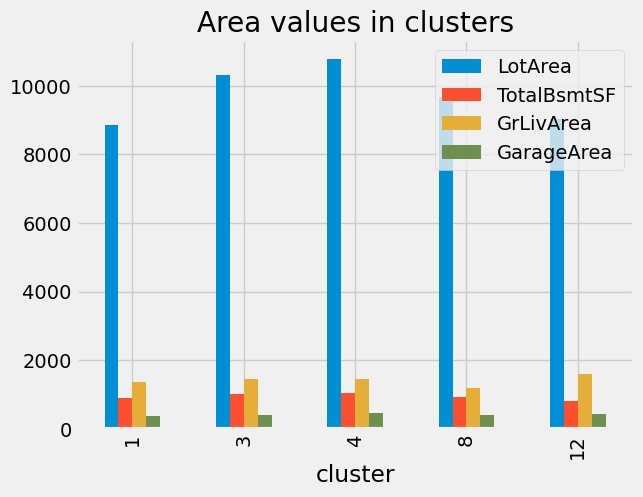

In [180]:
gb3_4_8_12_13_14[['LotArea', 'TotalBsmtSF', 'GrLivArea', 'GarageArea']].plot.bar(title = 'Area values in clusters')

In [179]:
for col in cat_cols:
    print(clusters3_4_8_12_13_14[clusters3_4_8_12_13_14['cluster'] == 3][col].value_counts())
    print(clusters3_4_8_12_13_14[clusters3_4_8_12_13_14['cluster'] == 8][col].value_counts())
    print(clusters3_4_8_12_13_14[clusters3_4_8_12_13_14['cluster'] == 4][col].value_counts())
    print(clusters3_4_8_12_13_14[clusters3_4_8_12_13_14['cluster'] == 13][col].value_counts())
    print('\n')

RL         379
RM          78
C (all)      4
RH           4
Name: MSZoning, dtype: int64
RL    42
RH     1
Name: MSZoning, dtype: int64
RL    55
Name: MSZoning, dtype: int64
Series([], Name: MSZoning, dtype: int64)


AllPub    465
Name: Utilities, dtype: int64
AllPub    43
Name: Utilities, dtype: int64
AllPub    54
NoSeWa     1
Name: Utilities, dtype: int64
Series([], Name: Utilities, dtype: int64)


Norm      385
Feedr      38
Artery     20
PosN        7
RRAn        6
PosA        6
RRNn        2
RRAe        1
Name: Condition1, dtype: int64
Norm     39
Feedr     2
RRAn      2
Name: Condition1, dtype: int64
Norm      48
PosN       2
RRAe       2
RRAn       1
PosA       1
Artery     1
Name: Condition1, dtype: int64
Series([], Name: Condition1, dtype: int64)


Norm     459
Feedr      4
PosA       1
RRAe       1
Name: Condition2, dtype: int64
Norm     42
Feedr     1
Name: Condition2, dtype: int64
Norm      54
Artery     1
Name: Condition2, dtype: int64
Series([], Name: Condition2, dtype: i

Дома в кластерах 8, 4, 13 и 3 отличаются внешней отделкой, площадью и годами постройки. Но в целом значительных различий с кластером 3 практически нет

Остальные кластеры очень малы, нет смысла выделять их отдельно